In [1]:
import sys
import os
import jax
import jax.numpy as np
import jax.tree as jtu
import jax.random as jr
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Basic jax import
jax.config.update("jax_enable_x64", True)


# Check if running on remote, and set directory to where notebook is run
if jax.devices()[0].platform == "gpu":
    os.chdir("code/amigo_project/notebooks/calibration")

# Add parent directories
paths = [os.path.abspath(os.path.join(os.getcwd(), path)) for path in ['..', "../.."]]
for path in paths:
    if path not in sys.path:
        sys.path.insert(0, path)
        
# Plotting set up
%matplotlib inline
plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = "lower"
plt.rcParams["figure.dpi"] = 120

inferno = mpl.colormaps["inferno"]
seismic = mpl.colormaps["seismic"]
coolwarm = mpl.colormaps["coolwarm"]

inferno.set_bad("k", 0.5)
seismic.set_bad("k", 0.5)
coolwarm.set_bad("k", 0.5)


def merge_cbar(ax):
    return make_axes_locatable(ax).append_axes("right", size="5%", pad=0.0)

ERROR:2025-04-30 04:54:13,325:jax._src.xla_bridge:647: Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda12.initialize()
Traceback (most recent call last):
  File "/home/louis/miniconda3/envs/jax_gpu/lib/python3.13/site-packages/jax/_src/xla_bridge.py", line 645, in discover_pjrt_plugins
    plugin_module.initialize()
    ~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "/home/louis/miniconda3/envs/jax_gpu/lib/python3.13/site-packages/jax_plugins/xla_cuda12/__init__.py", line 105, in initialize
    triton.register_compilation_handler(
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: module 'jax._src.lib.triton' has no attribute 'register_compilation_handler'


In [2]:
from amigo.files import get_files
from scipy.ndimage import binary_dilation

files = get_files("../../data/calslope/GO1843/", "calslope")

# Set the bad pixels
for file in files:
    file["BADPIX"].data[:, -1:] = 1
    file["BADPIX"].data[58, 67] = 1
    file["BADPIX"].data[-2:] = 1
    file["BADPIX"].data[4, 45] = 1

    # badpix = np.array(file["BADPIX"].data, dtype=bool)
    # im = np.array(file["SLOPE"].data.sum(0))
    # im = np.where(badpix, np.nan, im)
    # mask = binary_dilation(im == np.nanmax(im), iterations=2)
    # file["BADPIX"].data += mask.astype(int)

In [3]:
from amigo.ramp_models import DFRNN, RNNRamp
from amigo.detector_models import PixelSensitivity

dfnrnn_model = DFRNN(jr.key(0))
ramp_model = RNNRamp(dfnrnn_model, gain_model=PixelSensitivity(), norm=2**14)
ramp_model.values.size

11232

  0%|          | 0/3 [00:00<?, ?it/s]

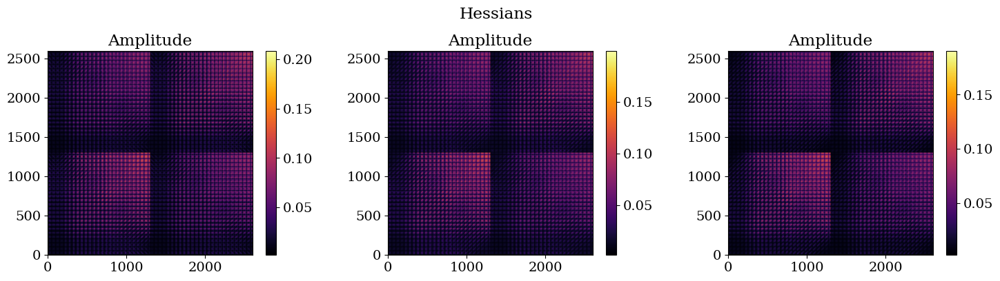

In [ ]:
from amigo.misc import tqdm
from amigo.vis_models import model_vis_psf
from amigo.stats import batched_jacobian, decompose
import dLux.utils as dlu
from amigo.optical_models import AMIOptics


state = np.load("../../GPU_files/results/cal_model.npy", allow_pickle=True).item()
# state = np.load("../../GPU_files/results/static_model.npy", allow_pickle=True).item()

optics = AMIOptics()

n_terms = 800
eig_mats = {}

plt.figure(figsize=(15, 4))
plt.suptitle("Hessians")
for i, filt in enumerate(tqdm(["F380M", "F430M", "F480M"])):
    n_knots = 51
    n_pts = (n_knots**2) - 1  # dont control the DC term
    vis_vec = np.zeros(n_pts)
    abb = state["aberrations"]
    defoc = state["defocus"][filt]

    output_fn = lambda x: dlu.downsample(x, 3, mean=False).flatten()
    vis_fn = lambda vis_vec: output_fn(
        model_vis_psf(optics, vis_vec, filt, abb, defoc, n_knots)
    )

    # print(abb.shape)
    # psf = model_vis_psf(optics, vis, filt, abb, defoc, n_knots)

    # #
    # psf = vis_fn(vis)
    # J = batched_jacobian(vis, lambda X: vis_fn(X), n_batch=20)
    # H, eig_vals, eig_vecs = decompose(J, psf)
    # eig_mats[filt] = eig_vecs

    psf = vis_fn(vis_vec)
    J = batched_jacobian(vis_vec, lambda X: vis_fn(X), n_batch=20)
    J_amp, J_phase = np.split(J, 2, axis=0)
    H_amp, eig_vals_amp, eig_vecs_amp = decompose(J_amp, psf)
    H_phase, eig_vals_phase, eig_vecs_phase = decompose(J_phase, psf)

    eig_mats[filt] = {
        "amplitudes": eig_vecs_amp,
        "phases": eig_vecs_phase,
    }

    plt.subplot(2, 3, i+1)
    plt.title("Amplitude")
    plt.imshow(np.abs(H_amp) ** 0.1, cmap="inferno")
    plt.colorbar()

    plt.subplot(2, 3, i + 4)
    plt.title("Phase")
    plt.imshow(np.abs(H_phase) ** 0.1, cmap="inferno")
    plt.colorbar()

plt.tight_layout()
plt.show()

# plt.figure(figsize=(10, 4))
# plt.title(f"{filt} Eigenvalues")
# plt.plot(amp_vals, label="Amplitude")
# plt.plot(phase_vals, label="Phase")
# plt.yscale("log")
# plt.tight_layout()
# plt.show()

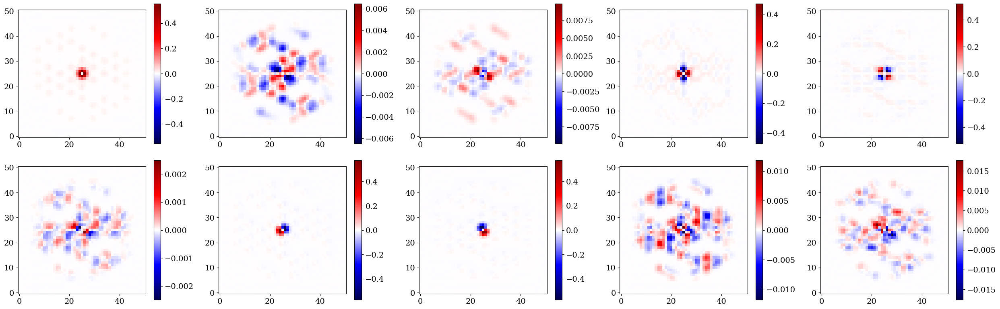

In [ ]:
from amigo.vis_models import vis_to_im, project

plt.figure(figsize=(25, 8))
for i in range(5):
    # log_amp, phase = np.array_split(eig_mats["F430M"][i], 2)
    log_amp = eig_mats["F430M"]["amplitudes"][i]
    phase = eig_mats["F430M"]["phases"][i]
    log_amp, phase = vis_to_im(log_amp, phase, (51, 51))

    v = np.nanmax(np.abs(log_amp))
    plt.subplot(2, 5, i + 1)
    plt.imshow(log_amp, seismic, vmin=-v, vmax=v)
    plt.colorbar()

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 5, i + 6)
    plt.imshow(phase, seismic, vmin=-v, vmax=v)
    plt.colorbar()

plt.tight_layout()
plt.show()

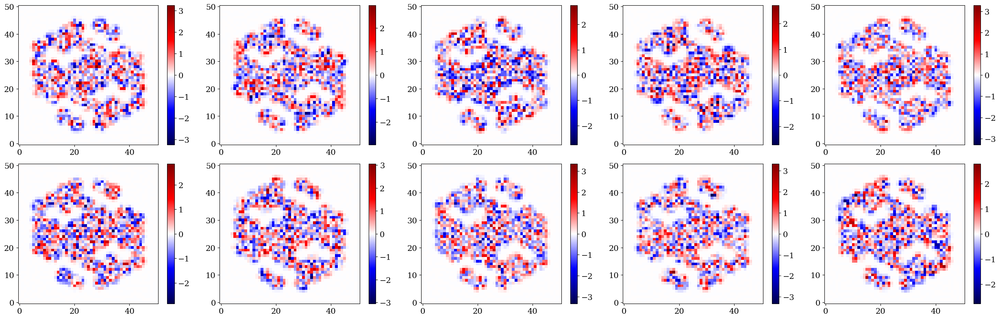

In [ ]:
n_basis = 400

plt.figure(figsize=(25, 8))
for i in range(5):
    # vis = np.dot(latent_vis, eig_vecs[:n_basis])
    # log_amp, phase = project(latent_vis, eig_mats["F430M"][:n_basis])
    
    #
    log_amp, phase = jr.normal(jr.key(i), (2, n_basis))
    log_amp, phase = project()

    amp, phase = vis_to_im(log_amp, phase, (51, 51))

    v = np.nanmax(np.abs(amp))
    plt.subplot(2, 5, i + 1)
    plt.imshow(amp, seismic, vmin=-v, vmax=v)
    plt.colorbar()

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 5, i + 6)
    plt.imshow(phase, seismic, vmin=-v, vmax=v)
    plt.colorbar()

plt.tight_layout()
plt.show()

In [7]:
from amigo.vis_models import LogVisModel

otf_coords = dlu.pixel_coords(51, 2 * optics.diameter)
vis_model = LogVisModel(eig_mats, otf_coords, n_terms=800)

In [8]:
# from amigo.model_fits import PointFit, SplineVisFit as _SplineVisFit

# class SplineVisFit(_SplineVisFit):
#     parang: float

#     def __init__(self, file, **kwargs):
#         self.parang = float(file[0].header["ROLL_REF"])
#         super().__init__(file, **kwargs)

In [9]:
from amigo.model_fits import PointFit, SplineVisFit

In [10]:
from amigo.core_models import AmigoModel
from amigo.optical_models import AMIOptics
from amigo.detector_models import SUB80Detector
from amigo.read_models import ReadModel

# Get the exposures and params
exposures = [SplineVisFit(file, joint_fit=True) for file in files]
# exposures = [PointFit(file) for file in files]


# Get the model
model = AmigoModel(
    exposures=exposures,
    optics=AMIOptics(),
    detector=SUB80Detector(ramp_model=ramp_model),
    read=ReadModel(),
    vis_model=vis_model,
)

In [11]:
# state = np.load("../../GPU_files/results/static_model.npy", allow_pickle=True).item()
state = np.load("../../GPU_files/results/cal_model.npy", allow_pickle=True).item()

for key, value in state.items():
    if key in ["aberrations"]:
        continue
    model = model.set(key, value)

for exp in exposures:
    model = model.set(exp.map_param("aberrations"), state["aberrations"])


# This seems to fix some recompile issues
def fn(x):
    if isinstance(x, jax.Array):
        if "i" in x.dtype.str:
            return x
        return np.array(x, dtype=float)
    return x


model = jtu.map(fn, model)

HD-205827


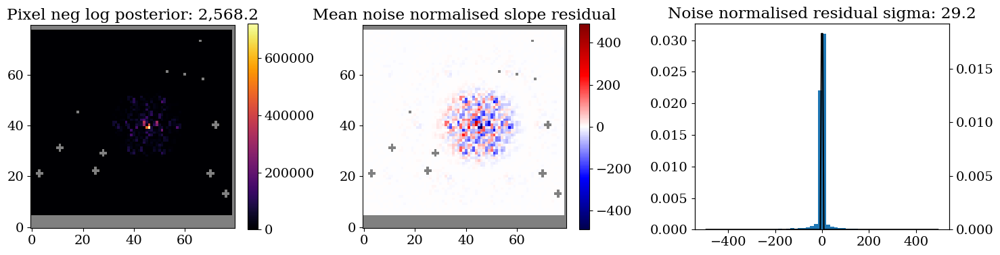

HD-206893


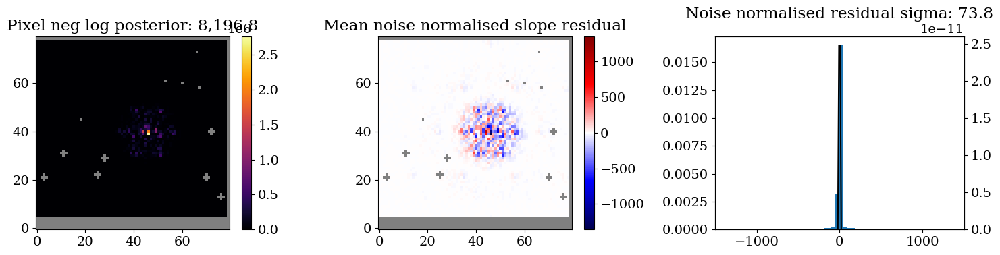

HD-206893


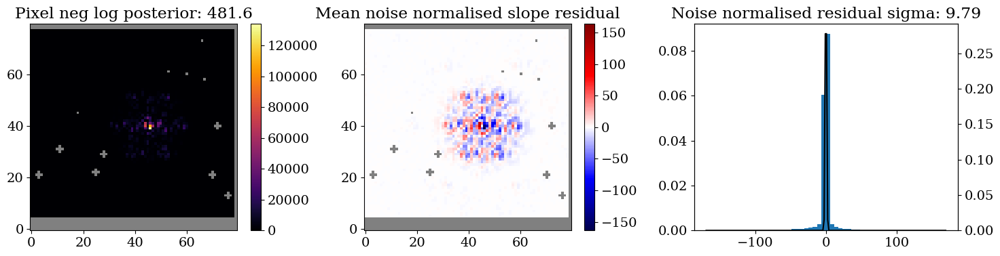

HD-205827


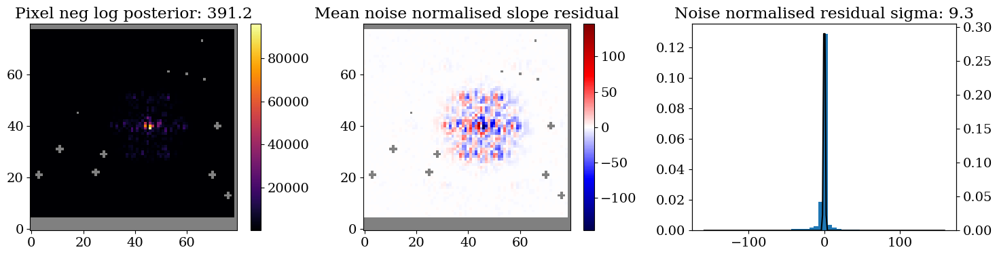

HD-206893


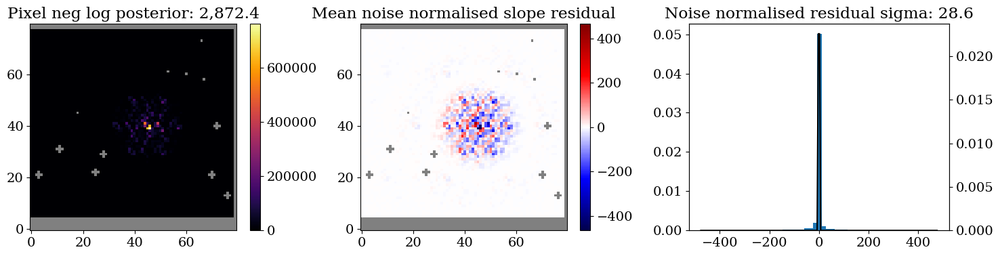

HD-205827


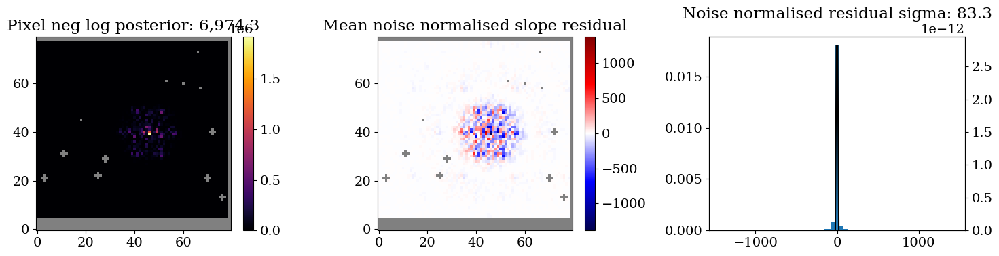

In [12]:
from amigo.plotting import summarise_fit

for exp in exposures:
    print(exp.star)
    summarise_fit(model, exp)

In [13]:
from jax import vmap


def mv_zscore(x, mu, cov):
    """Multivariate z-score, return identical gradients to normal log-likelihood"""
    return -0.5 * np.dot(x - mu, np.dot(np.linalg.inv(cov), x - mu))


def log_likelihood(model, exposure, return_im=False):
    # Get the model, data, and variances
    slope_vec = exposure.to_vec(exposure(model))
    data_vec = exposure.to_vec(exposure.slopes)
    cov_vec = exposure.to_vec(exposure.cov)

    # Calculate per-pixel likelihood
    loglike_vec = vmap(mv_zscore)(slope_vec, data_vec, cov_vec)

    # Return image or vector
    if return_im:
        # NOTE: Adds nans to the empty spots
        return exposure.from_vec(loglike_vec)
    return loglike_vec


def loss_fn(model, exposure, args=None):
    return -np.nanmean(log_likelihood(model, exposure)), ()

In [14]:
loss_fn(model, exposures[0])

(Array(2571.02230243, dtype=float64), ())

In [15]:
from amigo.fitting import Trainer

trainer = Trainer(loss_fn=loss_fn, cache="../../files")

trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    # reduce_ram=True,
    # batch_size=100,
    parameters=[
        "positions",
        "fluxes",
        "spectra",
        "one_on_fs"
    ],
)


  0%|          | 0/6 [00:00<?, ?it/s]

01843_002_01_06_1 - Invalid path one_on_fs.01843_002_01_06_1, no leaf found
01843_001_01_06_1 - Invalid path one_on_fs.01843_001_01_06_1, no leaf found
01843_001_01_05_1 - Invalid path one_on_fs.01843_001_01_05_1, no leaf found
01843_002_01_04_1 - Invalid path one_on_fs.01843_002_01_04_1, no leaf found
01843_001_01_07_1 - Invalid path one_on_fs.01843_001_01_07_1, no leaf found
01843_002_01_05_1 - Invalid path one_on_fs.01843_002_01_05_1, no leaf found


In [16]:
trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    reduce_ram=True,
    batch_size=10,
    parameters=[
        "aberrations",
        # "reflectivity",
    ],
)

  0%|          | 0/6 [00:00<?, ?it/s]

In [17]:
trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    reduce_ram=True,
    batch_size=25,
    parameters=[
        # "amplitudes",
        # "phases",
        "vis"
    ],
)

  0%|          | 0/6 [00:00<?, ?it/s]

In [18]:
from amigo.fitting import sgd, adam
from amigo.fitting import batch_exposures

# Pre-train optimisers
optimisers = {
    "positions": sgd(5e-1, 0),
    "fluxes": sgd(2e-1, 0),
    "aberrations": sgd(2e-2, 10),
    "vis": adam(2e-3, 250),
    # "amplitudes": adam(5e-3, 250),
    # "phases": adam(5e-3, 250),
    # "spectra": sgd(2e-1, 500),
    # "one_on_fs": sgd(1e-2, 100),
}

batches = batch_exposures(exposures, n_batch=1, key="cal")

# Train the model
result = trainer.train(
    model=model,
    optimisers=optimisers,
    epochs=5000,
    batches=batches,
)

  0%|          | 0/5000 [00:00<?, ?it/s]

Compiling Loss function...
Compiling update function...

Initial_loss Loss: 3,582.73
Estimated run time: 0:45:45
Full Time: 0:55:12
Final Loss: 9.71


In [19]:
#
losses = np.array(jtu.leaves(result.losses))
idx = np.where(losses == losses.min())[0][0]
best_state = jtu.map(lambda x: np.array(x[idx]), result.history, is_leaf=lambda x: isinstance(x, list))
result = result.set("model", best_state.inject(model))
result = result.set("state", best_state)

(5000,)


/tmp/ipykernel_1420598/534401063.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


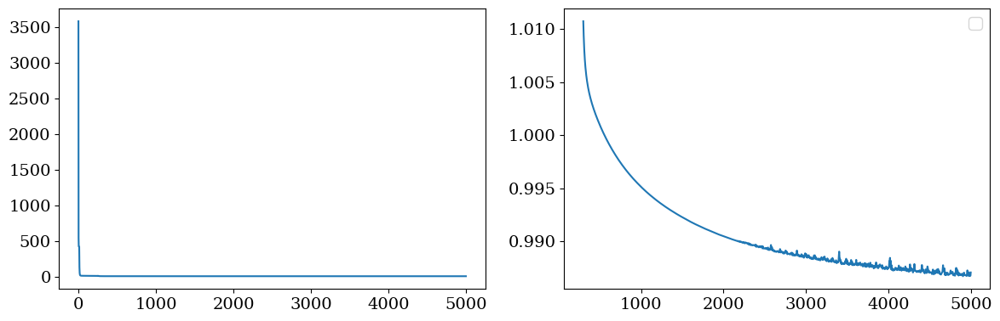

9.706745801625063


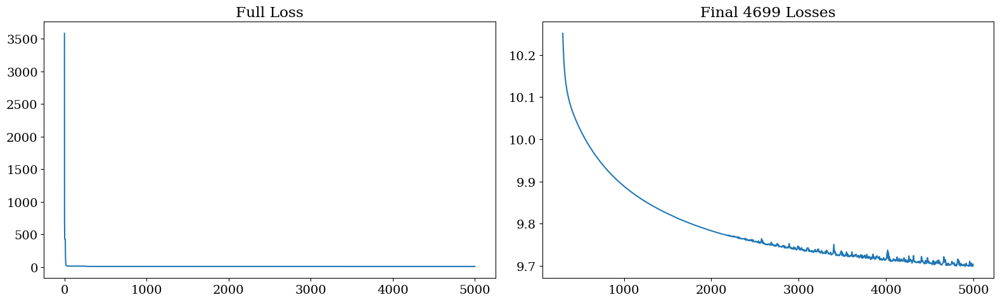

In [20]:
from amigo.plotting import plot, plot_losses, summarise_fit


losses = np.array([v for v in result.losses.values()]).mean(0)

print(losses.shape)

start = 300
stop = len(losses)
# stop = 40
xs = np.arange(start, stop)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
# plt.plot(np.array(losses).mean(1))
plt.plot(losses)
plt.subplot(1, 2, 2)
# plt.plot(xs, np.array(losses).mean(1)[xs])
plt.plot(xs, np.log10(losses[xs]))
plt.legend()
plt.tight_layout()
plt.show()

print(losses[-1].mean())
plot_losses(np.array(losses), start=start, stop=-1)

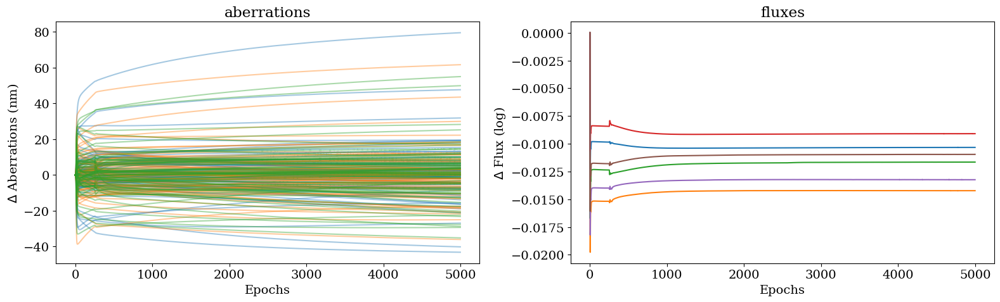

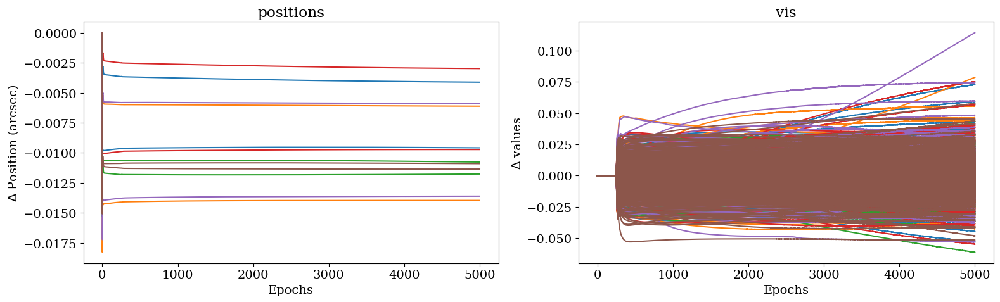

In [21]:
plot(result.history, start=0)

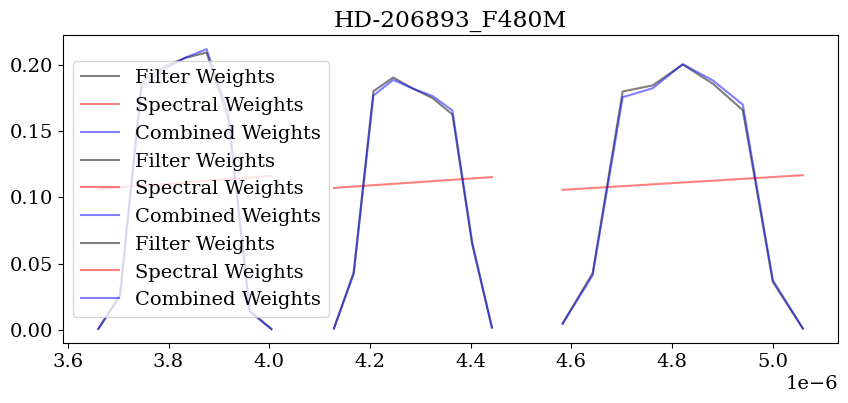

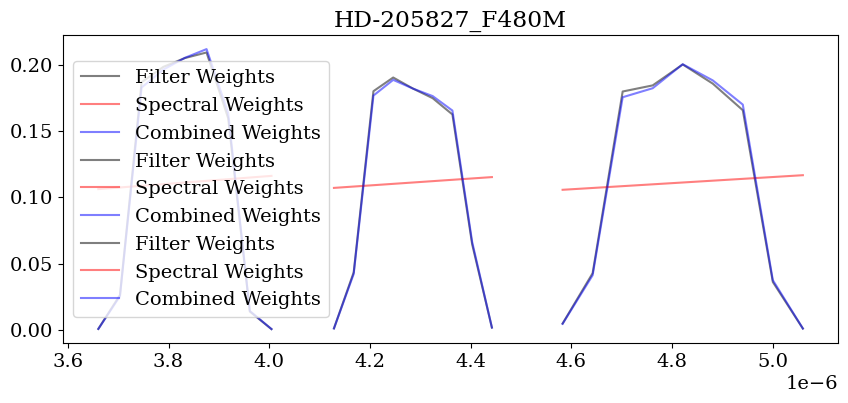

In [22]:
stars = list(set([exp.star for exp in exposures]))

for targ_star in stars:
    plt.figure(figsize=(10, 4))
    for key, spec in result.model.spectra.items():
        star, filt = key.split("_")

        if star != targ_star:
            continue

        wavels, filt_weights = model.filters[filt]
        xs = np.linspace(-1, 1, len(wavels))

        spectra_slopes = 1 + spec * xs
        spec_weights = spectra_slopes * wavels
        weights = filt_weights * spec_weights


        weights = weights / weights.sum()
        spec_weights = spec_weights / spec_weights.sum()

        plt.title(key)
        plt.plot(wavels, filt_weights, c='k', alpha=0.5, label="Filter Weights")
        plt.plot(wavels, spec_weights, c='r', alpha=0.5, label="Spectral Weights")
        plt.plot(wavels, weights, c='b', alpha=0.5, label="Combined Weights")

    plt.legend()
    plt.show()

F380M Sci 8.92


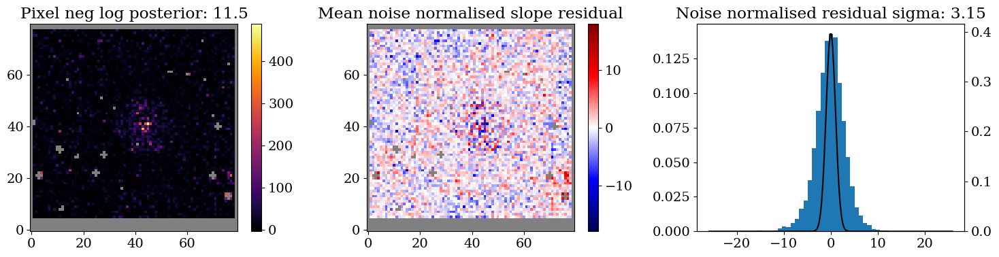

F380M Cal 6.95


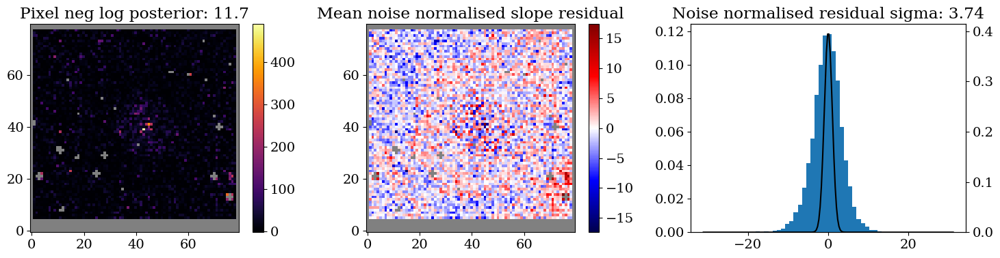

F430M Cal 11.26


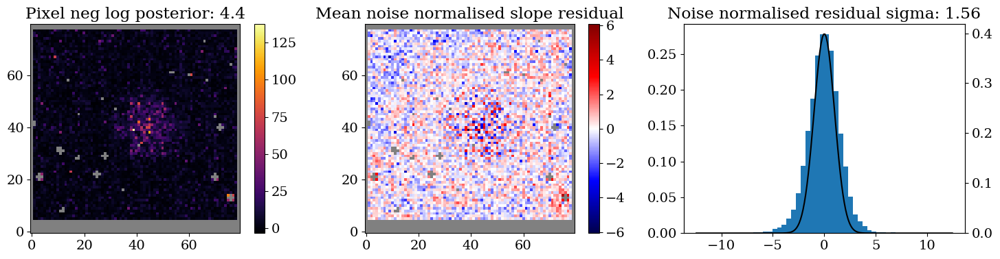

F430M Sci 11.23


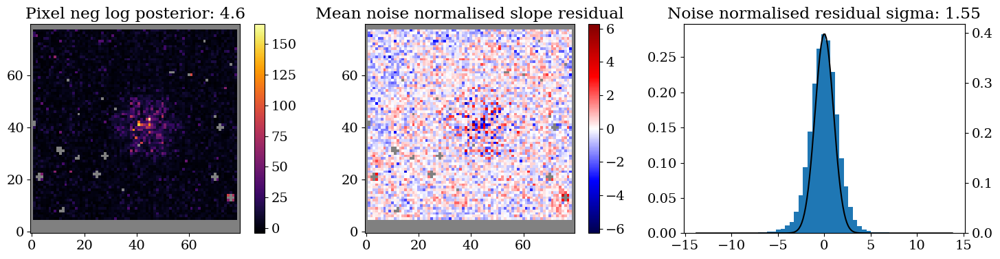

F480M Sci 12.78


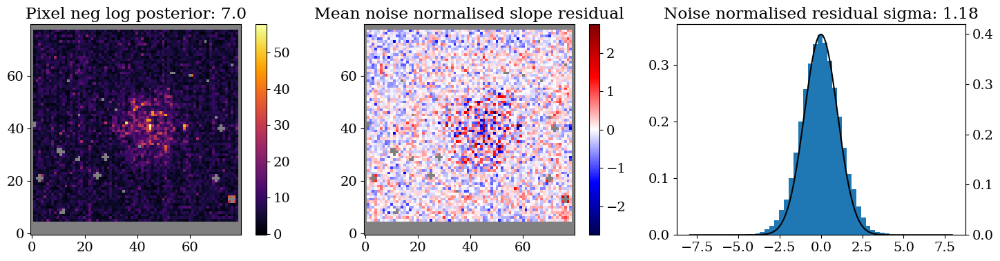

F480M Cal 11.75


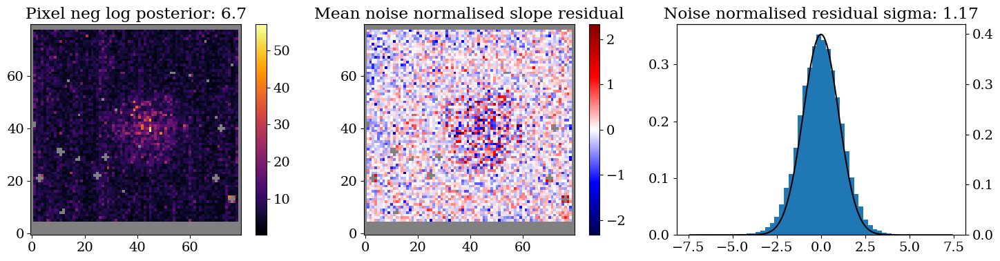

In [23]:
from scipy.ndimage import binary_dilation

for filt in ["F380M", "F430M", "F480M"]:
    for exp in exposures:
        if exp.filter == filt:
            exp_type = "Cal" if exp.calibrator else "Sci"
            im = np.nansum(exp.slopes.at[:, exp.badpix].set(np.nan), 0)
            max_im = np.nanmax(im)
            peak_mask = binary_dilation(im == max_im, iterations=3)
            print(exp.filter, exp_type, f"{max_im / 1e3:.2f}")

            badpix = exp.badpix # | peak_mask
            support = np.where(~np.array(badpix, bool))
            test_exp  = exp.set("support", support)

            # plt.show()
            # test_exp = exp.set("badpix", exp.badpix | peak_mask)
            summarise_fit(result.model, test_exp)
        # summarise_fit(test_model, exp)

In [24]:
abb_vals = {key.split("_")[1]: v for key, v in result.model.aberrations.items()}
print(jtu.map(lambda x: np.array(x).shape, abb_vals))

{'F380M': (7, 10), 'F430M': (7, 10), 'F480M': (7, 10)}


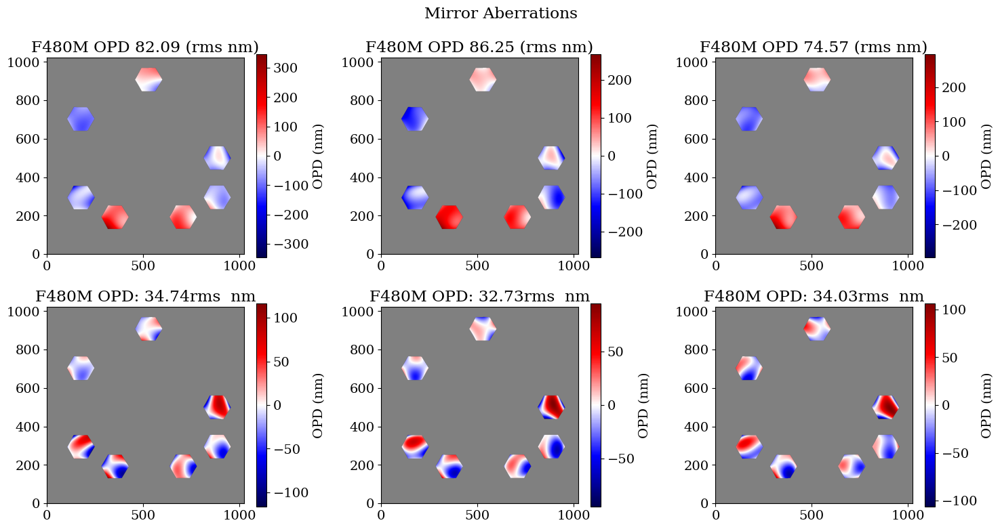

In [25]:
pupil_mask = result.model.optics.pupil_mask
# mask = pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
mask = pupil_mask.transmission

plt.figure(figsize=(15, 8))
plt.suptitle("Mirror Aberrations")
# for i, key in enumerate(result.model.aberrations.keys()):
for i, filt in enumerate(abb_vals.keys()):
    coeffs = abb_vals[filt]
    full_abb = pupil_mask.set("abb_coeffs", coeffs).calc_aberrations()
    flat_abb = pupil_mask.set("abb_coeffs", coeffs.at[:, :3].set(0)).calc_aberrations()

    full_abb = np.where(mask < 1.0, np.nan, 1e9 * full_abb)
    flat_abb = np.where(mask < 1.0, np.nan, 1e9 * flat_abb)
    full_abb -= np.nanmean(full_abb)
    flat_abb -= np.nanmean(flat_abb)

    rms = lambda x: np.sqrt(np.nanmean(np.square(x)))

    filt = key.split("_")[-1]
    # print(f"{filt}: {rms(full_abb):.2f} - {rms(flat_abb):.2f} rms (nm)")

    v = np.nanmax(np.abs(full_abb))
    plt.subplot(2, 3, i + 1)
    plt.title(f"{filt} OPD {rms(full_abb):.2f} (rms nm)")
    plt.imshow(full_abb, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar(label="OPD (nm)")

    v = np.nanmax(np.abs(flat_abb))
    plt.subplot(2, 3, i + 4)
    plt.title(f"{filt} OPD: {rms(flat_abb):.2f}rms  nm")
    plt.imshow(flat_abb, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar(label="OPD (nm)")

plt.tight_layout()
plt.show()

In [26]:
from jax.scipy.signal import correlate

# mask = optics.pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
mask = pupil_mask.transmission
mask = dlu.downsample(mask, 8, mean=True)
splodges = correlate(mask, mask, method="fft")
splodges /= splodges.max()
splodges = dlu.downsample(splodges, 5, mean=False)
otf_mask = splodges > 0.25

exp_dict = {"cal": {}, "sci": {}}
for exp in exposures:
    if exp.calibrator:
        # if exp.star == "HD-36805":
        # if exp.star == "HD-37093":
        exp_dict["cal"][exp.filter] = exp
    else:
        exp_dict["sci"][exp.filter] = exp


filters = sorted(list(set([exp.filter for exp in exposures])))
stars = list(set([exp.star for exp in exposures]))

HD-206893 F380M


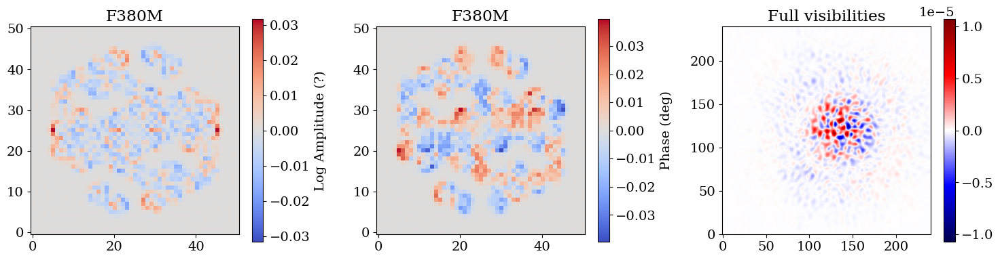

HD-205827 F380M


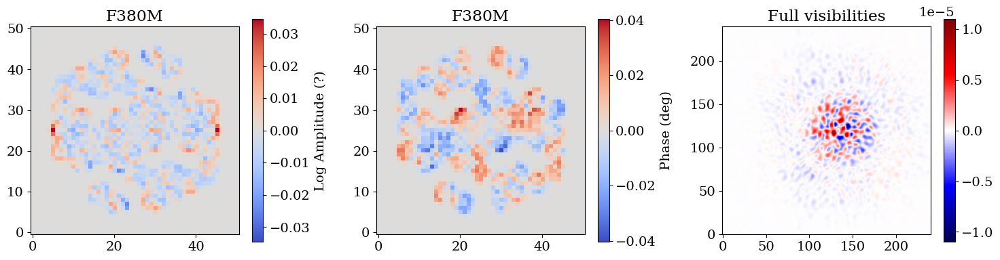

HD-206893 F430M


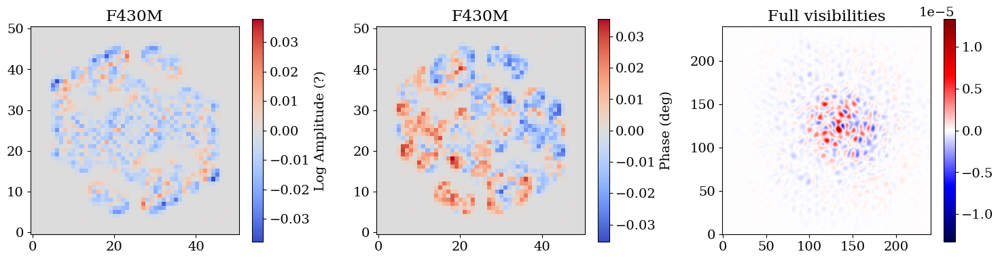

HD-205827 F430M


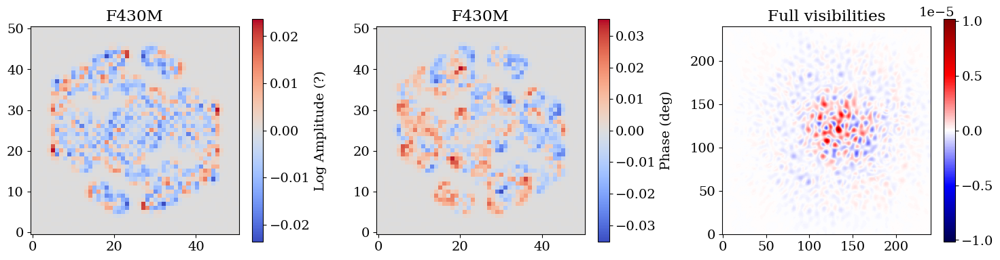

HD-206893 F480M


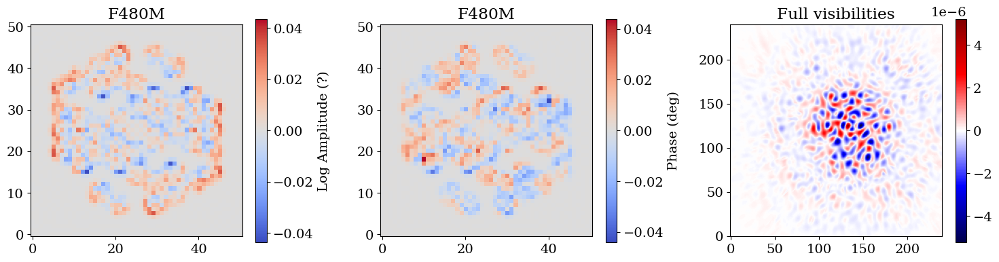

HD-205827 F480M


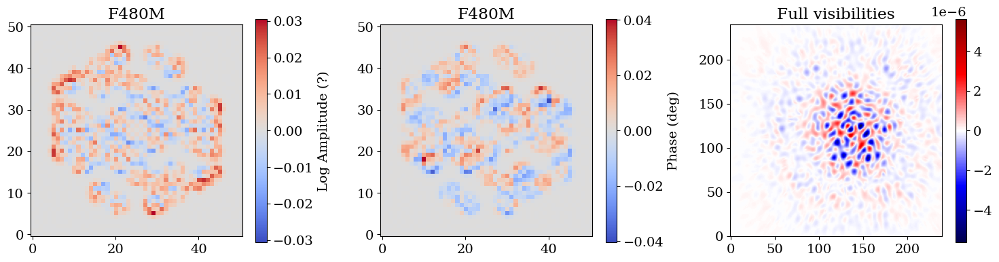

In [27]:
for filt in filters:
    for star in stars:
        for exp in exposures:
            if exp.star == star and exp.filter == filt:
                break
        print(exp.star, exp.filter)

        latent_vis = result.model.get(exp.map_param("vis"))
        log_amp, phase = project(latent_vis, vis_model.V[filt])
        log_amp, phase = vis_to_im(log_amp, phase, (51, 51))

        plt.figure(figsize=(15, 4))

        v = np.nanmax(np.abs(log_amp))
        plt.subplot(1, 3, 1)
        plt.title(f"{filt}")
        plt.imshow(log_amp, coolwarm, vmin=-v, vmax=v)
        plt.colorbar(label="Log Amplitude (?)")

        v = np.nanmax(np.abs(phase))
        plt.subplot(1, 3, 2)
        plt.title(f"{filt}")
        plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
        plt.colorbar(label="Phase (deg)")

        # plt.tight_layout()
        # plt.show()

        #
        vis_key = exp.map_param("vis")
        null_vis = np.zeros_like(latent_vis)
        null_psf = exp.model_psf(result.model.set(vis_key, null_vis)).data
        full_psf = exp.model_psf(result.model).data

        # plt.figure(figsize=(15, 4))

        res = null_psf - full_psf
        v = np.nanmax(np.abs(res))
        plt.subplot(1, 3, 3)
        plt.title("Full visibilities")
        plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
        plt.colorbar()

        # res = null_psf - amp_psf
        # v = np.nanmax(np.abs(res))
        # plt.subplot(1, 3, 2)
        # plt.title("Amplitudes only")
        # plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
        # plt.colorbar()

        # res = null_psf - phase_psf
        # v = np.nanmax(np.abs(res))
        # plt.subplot(1, 3, 3)
        # plt.title("Phases only")
        # plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
        # plt.colorbar()

        plt.tight_layout()
        plt.show()

HD-206893 F380M


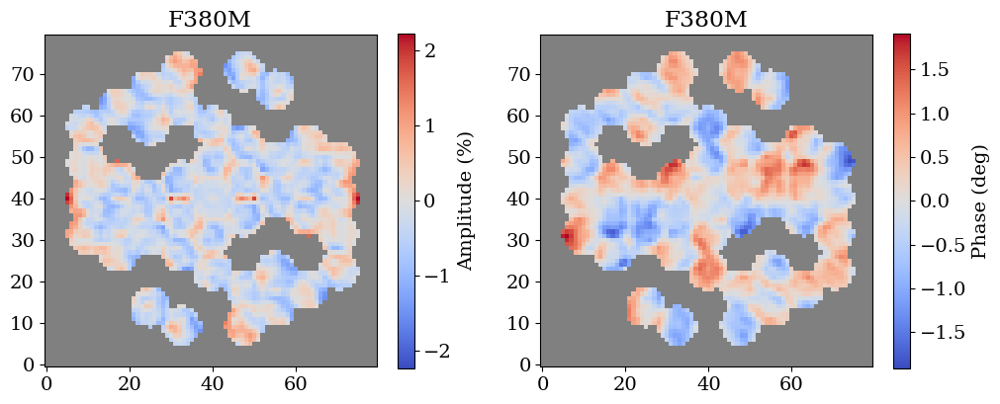

HD-205827 F380M


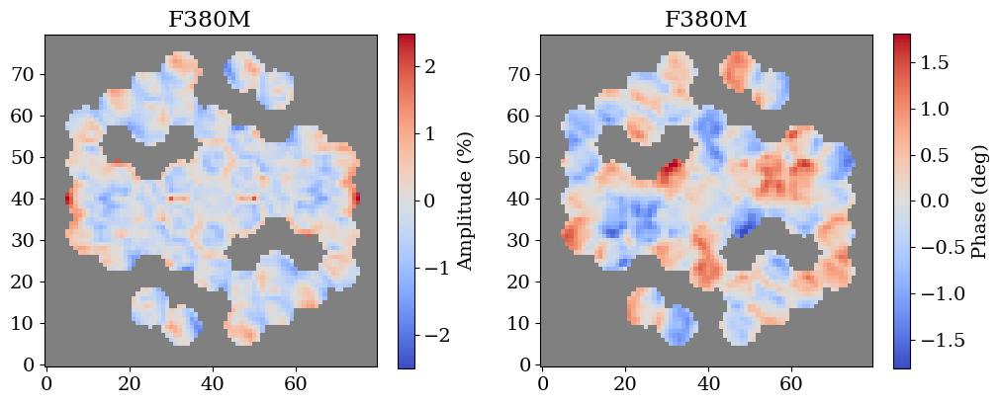

HD-206893 F430M


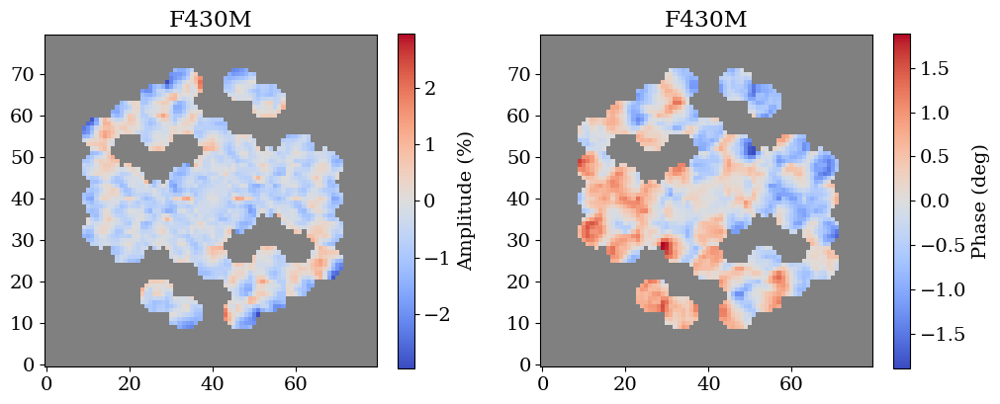

HD-205827 F430M


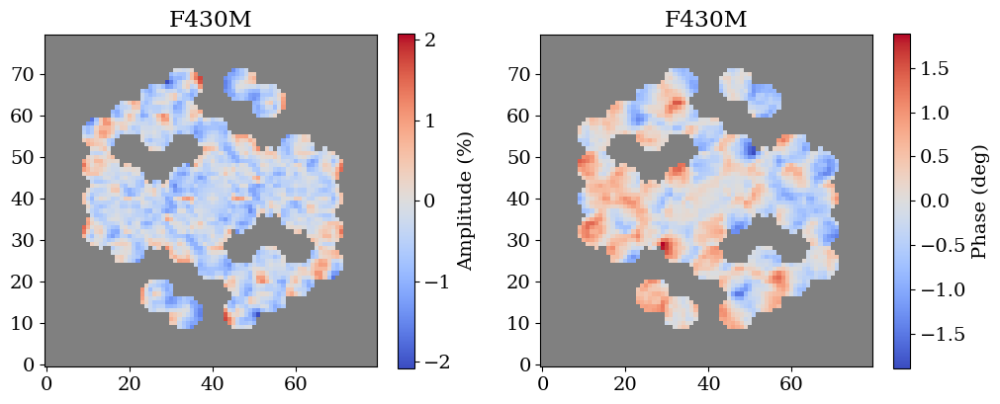

HD-206893 F480M


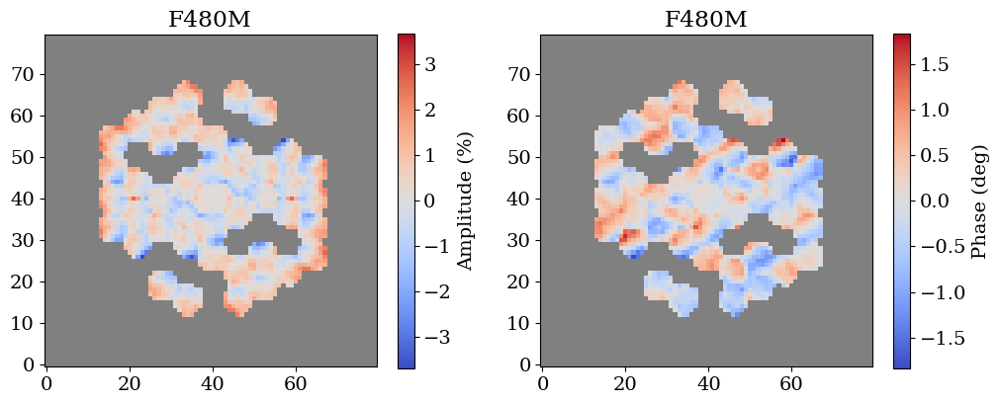

HD-205827 F480M


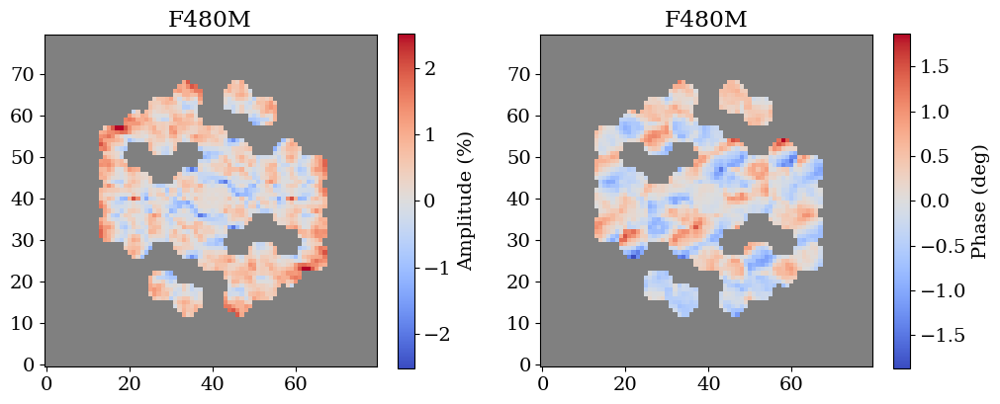

In [28]:
outputs = {
    "F380M": {},
    "F430M": {},
    "F480M": {},
}

for filt in filters:
    for star in stars:
        for exp in exposures:
            if exp.star == star and exp.filter == filt:
                break
        print(exp.star, exp.filter)

        latent_vis = result.model.get(exp.map_param("vis"))
        log_amp, phase = project(latent_vis, vis_model.V[filt])
        log_amp, phase = vis_to_im(log_amp, phase, (51, 51))

        #
        vis_key = exp.map_param("vis")
        null_vis = np.zeros_like(latent_vis)
        null_psf = exp.model_psf(result.model.set(vis_key, null_vis)).data
        full_psf = exp.model_psf(result.model).data

        null_splodges = np.fft.fftshift(np.fft.fft2(null_psf))
        full_splodges = np.fft.fftshift(np.fft.fft2(full_psf))
        vis_signal = full_splodges / null_splodges

        amp = np.abs(vis_signal)
        phase = np.angle(vis_signal)
        outputs[filt][star] = np.array([amp, phase])

        otf = np.abs(null_splodges) > 0.01
        outputs[filt]["otf"] = otf

        amp = np.where(otf, 100*(amp - 1), np.nan)
        phase = np.where(otf, dlu.rad2deg(phase), np.nan)

        c = amp.shape[0]//2
        s = 40
        amp = amp[c-s:c+s, c-s:c+s]
        phase = phase[c-s:c+s, c-s:c+s]

        plt.figure(figsize=(15, 4))

        v = np.nanmax(np.abs(amp))
        plt.subplot(1, 3, 1)
        plt.title(f"{filt}")
        plt.imshow(amp, coolwarm, vmin=-v, vmax=v)
        plt.colorbar(label="Amplitude (%)")

        v = np.nanmax(np.abs(phase))
        plt.subplot(1, 3, 2)
        plt.title(f"{filt}")
        plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
        plt.colorbar(label="Phase (deg)")

        plt.tight_layout()
        plt.show()

F380M


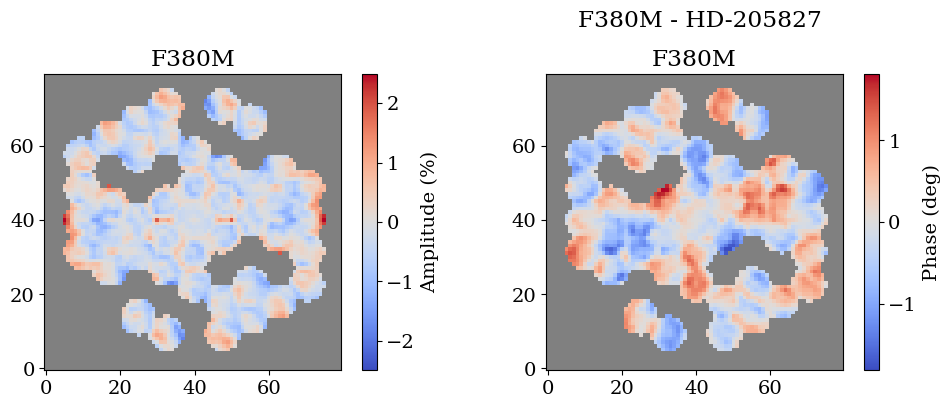

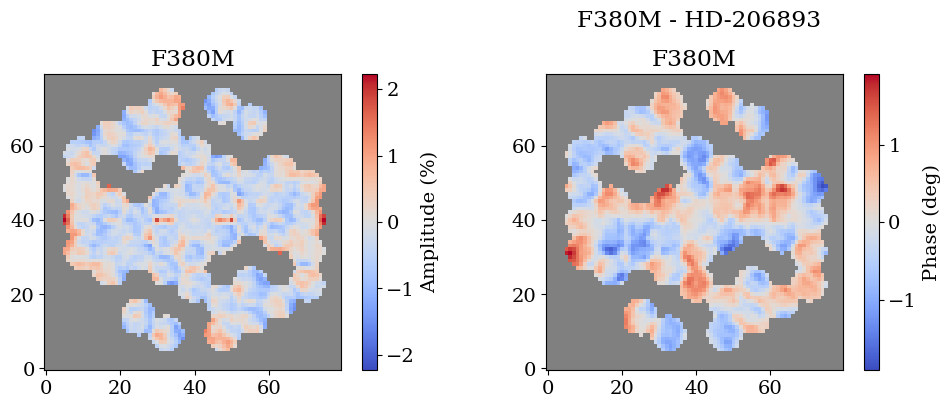

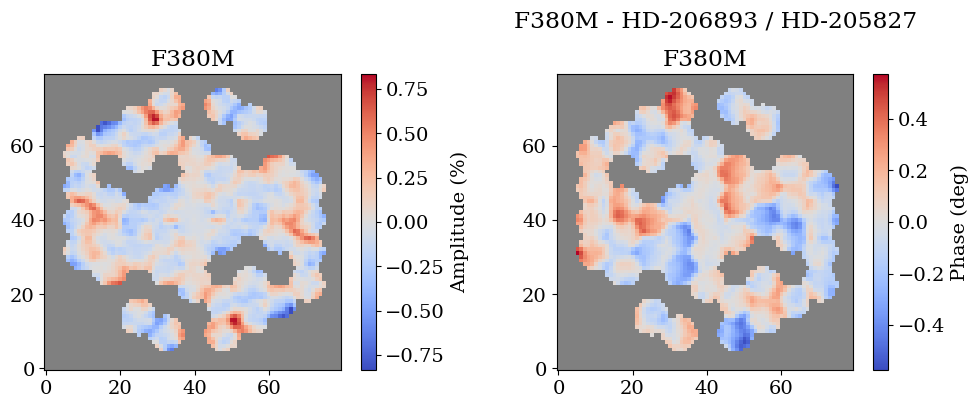

F430M


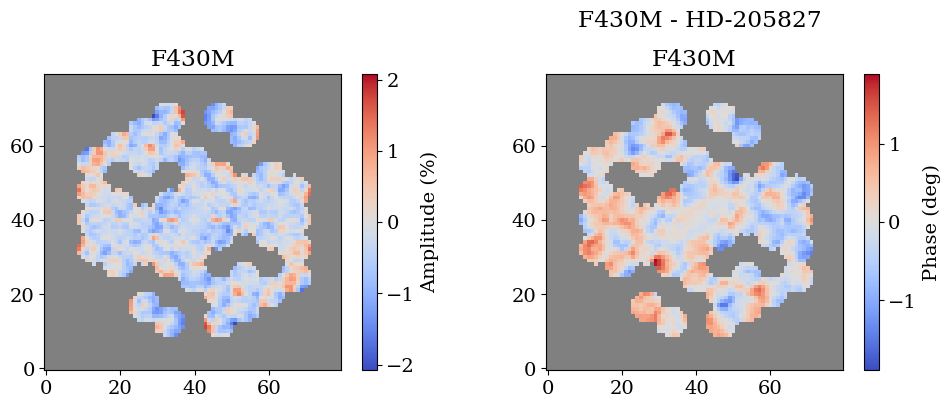

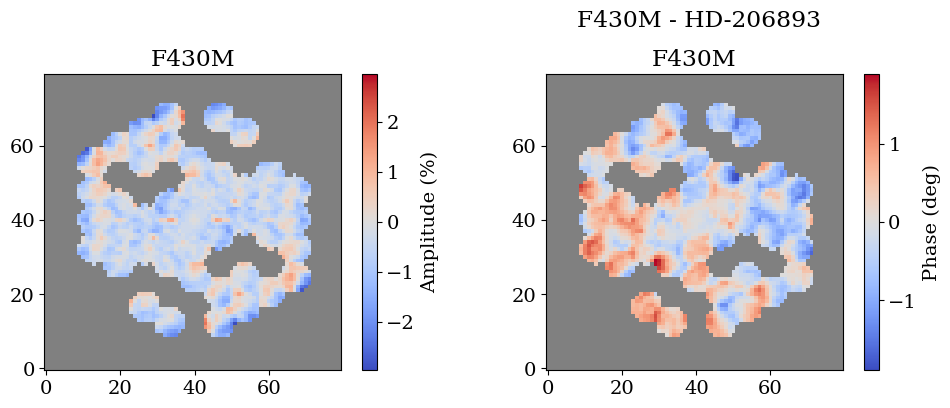

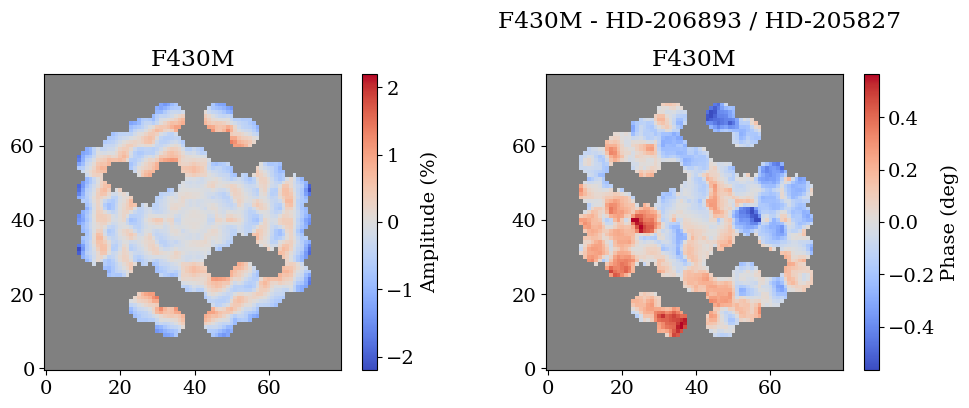

F480M


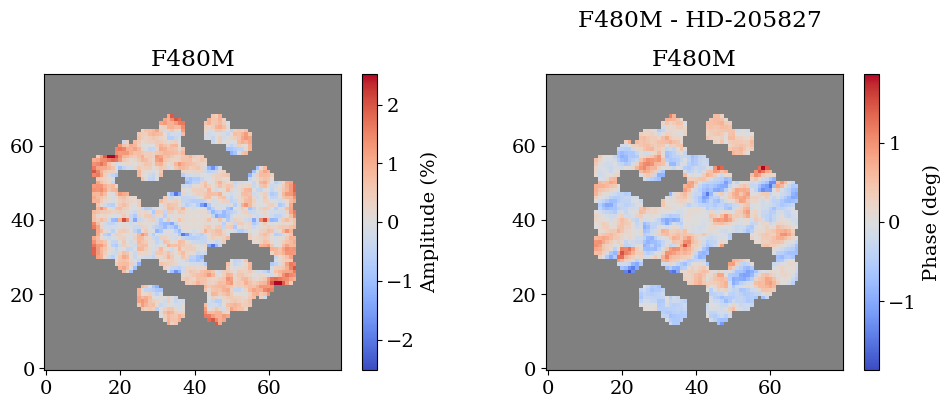

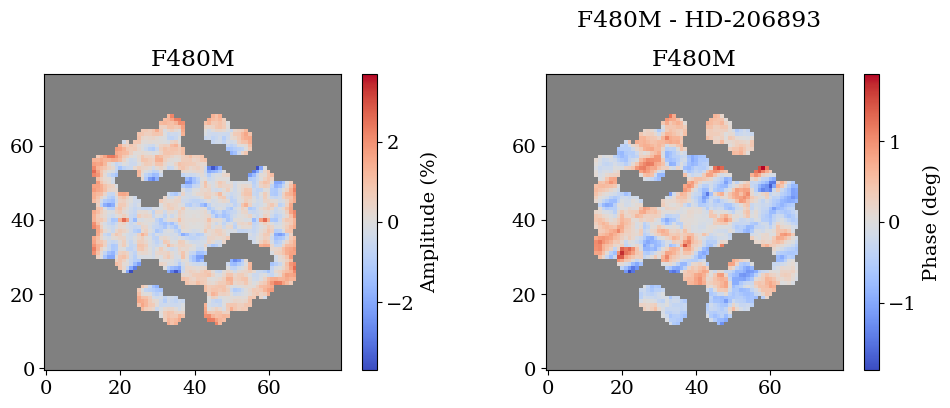

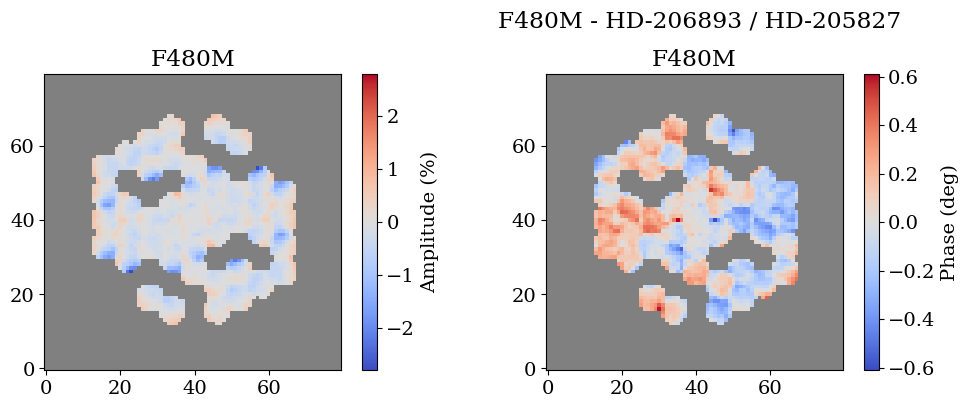

In [29]:
for filt in outputs.keys():
    cal_amp, cal_phase = outputs[filt]["HD-205827"]
    sci_amp, sci_phase = outputs[filt]["HD-206893"]
    otf = outputs[filt]["otf"]

    print(filt)
    c = otf.shape[0] // 2
    s = 40
    cal_amp = np.where(otf, cal_amp, np.nan)[c-s:c+s, c-s:c+s]
    cal_phase = np.where(otf, cal_phase, np.nan)[c-s:c+s, c-s:c+s]
    sci_amp = np.where(otf, sci_amp, np.nan)[c-s:c+s, c-s:c+s]
    sci_phase = np.where(otf, sci_phase, np.nan)[c-s:c+s, c-s:c+s]

    amp = sci_amp / cal_amp
    phase = sci_phase - cal_phase

    cal_amp -= 1
    sci_amp -= 1
    amp -= 1

    cal_amp *= 100
    sci_amp *= 100
    amp *= 100

    cal_phase = dlu.rad2deg(cal_phase)
    sci_phase = dlu.rad2deg(sci_phase)
    phase = dlu.rad2deg(phase)

    plt.figure(figsize=(15, 4))
    plt.suptitle(f"{filt} - HD-205827")

    v = np.nanmax(np.abs(cal_amp))
    plt.subplot(1, 3, 1)
    plt.title(f"{filt}")
    plt.imshow(cal_amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(cal_phase))
    plt.subplot(1, 3, 2)
    plt.title(f"{filt}")
    plt.imshow(cal_phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(15, 4))
    plt.suptitle(f"{filt} - HD-206893")

    v = np.nanmax(np.abs(sci_amp))
    plt.subplot(1, 3, 1)
    plt.title(f"{filt}")
    plt.imshow(sci_amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(sci_phase))
    plt.subplot(1, 3, 2)
    plt.title(f"{filt}")
    plt.imshow(sci_phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(15, 4))
    plt.suptitle(f"{filt} - HD-206893 / HD-205827")

    v = np.nanmax(np.abs(amp))
    plt.subplot(1, 3, 1)
    plt.title(f"{filt}")
    plt.imshow(amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(phase))
    plt.subplot(1, 3, 2)
    plt.title(f"{filt}")
    plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

    plt.tight_layout()
    plt.show()

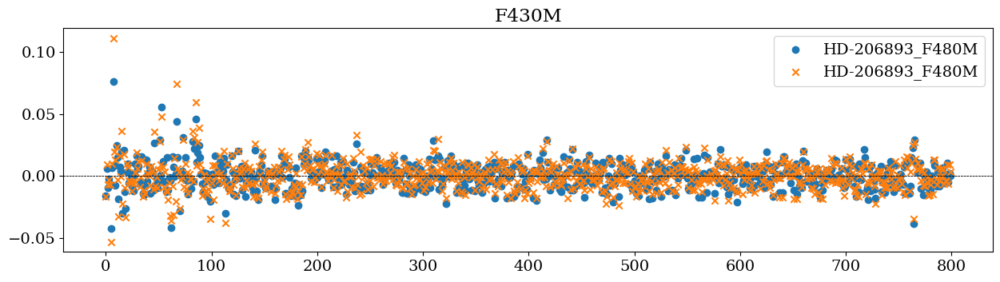

In [30]:
plt.figure(figsize=(15, 8))
for exp in exposures:
    vis = result.model.get(exp.map_param("vis"))
    if exp.filter == "F430M":
        if exp.star == "HD-206893":
            m, alpha = "x", 1.0
            label = "HD-206893"
        else:
            m, alpha = "o", 1.
        plt.subplot(2, 1, 1)
        plt.title("F430M")
        plt.scatter(np.arange(len(vis)), vis, label=key, marker=m, alpha=alpha)
        plt.axhline(0, color="k", ls="--", lw=0.5)
        plt.legend()

# for exp in exposures:
#     phase = result.model.get(exp.map_param("phases"))
#     if exp.filter == "F480M":
#         if exp.star == "HD-206893":
#             m, alpha = "x", 1.0
#             label = "HD-206893"
#         else:
#             m, alpha = "o", 0.25
#         plt.subplot(2, 1, 2)
#         plt.title("F480M")
#         plt.scatter(np.arange(len(phase)), phase, label=key, marker=m, alpha=alpha)
#         plt.axhline(0, color="k", ls="--", lw=0.5)
#         plt.legend()
# plt.tight_layout()
# plt.show()

In [31]:
exposures_pos1 = []
exposures_pos2 = []
for exp in exposures:
    pos = result.model.get(exp.map_param("positions"))
    r = 1e3 * np.hypot(*pos)
    if r < 500:
        exposures_pos1.append(exp)
    else:
        exposures_pos2.append(exp)

for exp in exposures_pos1:
    print(exp.observation, exp.act_id)
print()

for exp in exposures_pos2:
    print(exp.observation, exp.act_id)
print()

002 01
001 01
001 01
002 01
001 01
002 01




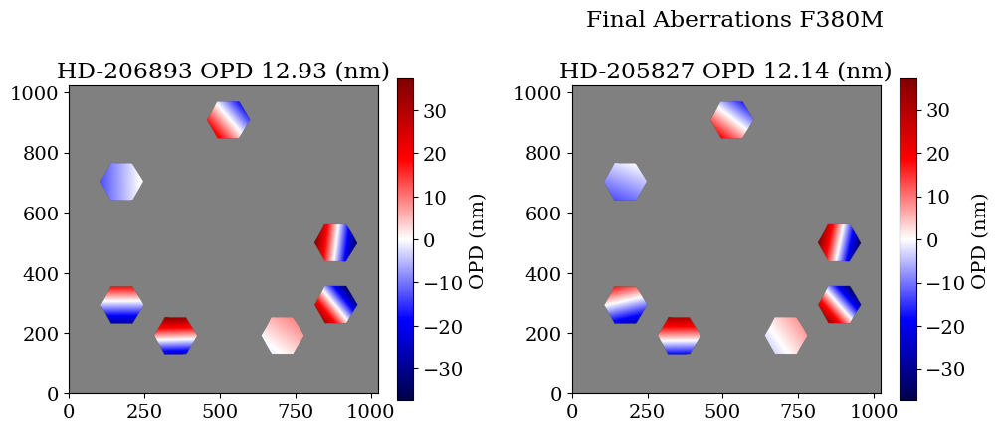

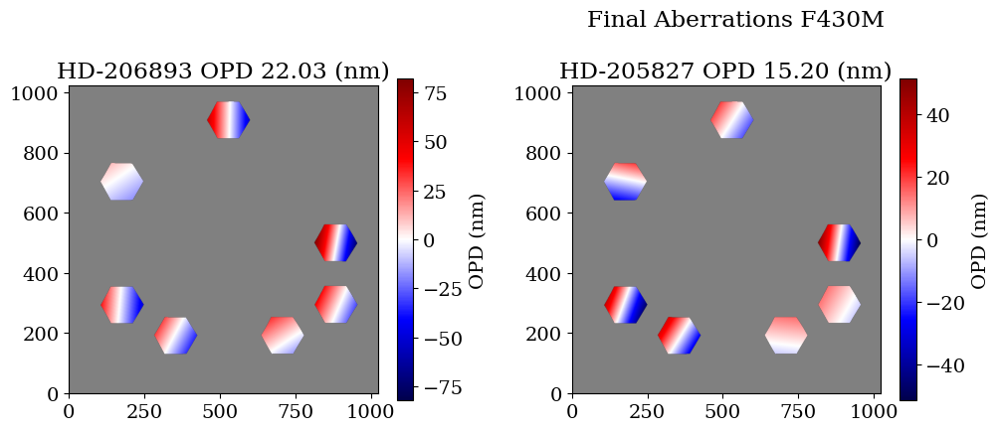

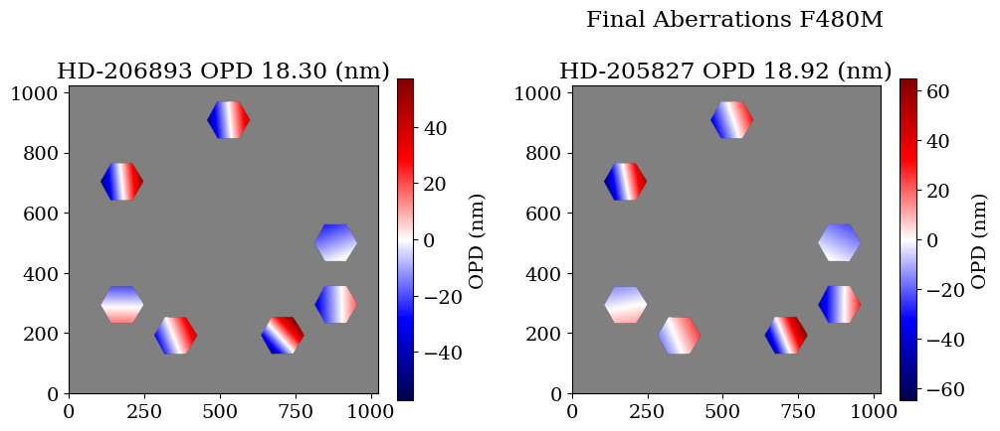

In [32]:
from amigo.stats import model_batched_jacobian
from amigo.vis_models import vis_jac_fn

pupil_mask = result.model.optics.pupil_mask
# mask = pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
mask = pupil_mask.transmission
rms = lambda x: np.sqrt(np.nanmean(np.square(x)))
final_coeffs = {}

params = ["aberrations", "positions"]

rms_opd = {}

for filt in filters:
    plt.figure(figsize=(15, 8))
    plt.suptitle(f"Final Aberrations {filt}")

    for i, star in enumerate(stars):
        for exp in exposures_pos1:
            if exp.star == "HD-205827" and exp.filter == filt:
                # if exp.star == star and exp.filter == filt:
                break

        # # Calculate the jacobian on the calibrator
        # fn = lambda model, exp: np.angle(model_vis(model, exp).flatten())
        # J_phase = model_batched_jacobian(fn, result.model, exp, params, n_batch=5)
        # npix = J_phase[..., -1].size // 2
        # n_terms = J_phase.shape[-1]
        # J = J_phase.reshape(-1, n_terms)[:npix]

        # Get the Jacobian
        fn = lambda model, exp: vis_jac_fn(model, exp)
        J = model_batched_jacobian(fn, model, exp, params, n_batch=2)

        # # Get the Jacobian decomposition
        # u, s, vh = np.linalg.svd(J, full_matrices=True)
        # s /= s[0]
        # n_keep = np.sum(s < 1e-12)

        # null_operator = u[:, len(s) - n_keep :].T

    for i, star in enumerate(stars):
        for exp in exposures_pos1:
            if exp.star == star and exp.filter == filt:
                break

        latent_vis = result.model.get(exp.map_param("vis"))
        # vis = np.dot(latent_vis, vis_model.V[exp.filter])

        # print(vis.shape)
        # print(J.shape)
        # print(np.linalg.pinv(J).shape)

        z = np.dot(np.linalg.pinv(J), latent_vis)
        coeffs = z[:-2].reshape(7, 10)
        coeffs = coeffs.at[:, 3:].set(0)

        full_coeffs = coeffs
        final_coeffs[filt] = full_coeffs

        full_abb = pupil_mask.set("abb_coeffs", full_coeffs).calc_aberrations()
        flat_abb = pupil_mask.set(
            "abb_coeffs", full_coeffs.at[:, :3].set(0)
        ).calc_aberrations()
        full_abb = np.where(mask < 1.0, np.nan, 1e9 * full_abb)
        flat_abb = np.where(mask < 1.0, np.nan, 1e9 * flat_abb)

        if exp.observation not in rms_opd:
            rms_opd[exp.observation] = {}
        rms_opd[exp.observation][exp.act_id] = rms(full_abb)

        v = np.nanmax(np.abs(full_abb))
        plt.subplot(2, 3, i+1)
        plt.title(f"{star} OPD {rms(full_abb):.2f} (nm)")
        plt.imshow(full_abb, cmap=seismic, vmin=-v, vmax=v)
        plt.colorbar(label="OPD (nm)")

    plt.tight_layout()
    plt.show()

    # np.save("../../GPU_files/temp/primary_coeffs", final_coeffs, allow_pickle=True)

In [33]:
# pupil_mask = result.model.optics.pupil_mask
# # mask = pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
# mask = pupil_mask.transmission
# rms = lambda x: np.sqrt(np.nanmean(np.square(x)))
# final_coeffs = {}

# params = ["aberrations", "positions"]


# for filt in filters:
#     plt.figure(figsize=(15, 8))
#     plt.suptitle(f"Final Aberrations {filt}")

#     for i, star in enumerate(stars):
#         for exp in exposures_pos2:
#             if exp.star == "HD-205827" and exp.filter == filt:
#                 break

#         # # Calculate the jacobian on the calibrator
#         # fn = lambda model, exp: np.angle(model_vis(model, exp).flatten())
#         # J_phase = model_batched_jacobian(fn, result.model, exp, params, n_batch=5)
#         # npix = J_phase[..., -1].size // 2
#         # n_terms = J_phase.shape[-1]
#         # J = J_phase.reshape(-1, n_terms)[:npix]

#         # Get the Jacobian
#         fn = lambda model, exp: vis_jac_fn(model, exp)
#         J = model_batched_jacobian(fn, model, exp, params, n_batch=2)

#     for i, star in enumerate(stars):
#         for exp in exposures_pos2:
#             if exp.star == star and exp.filter == filt:
#                 break

#         phases = result.model.get(exp.map_param("phases"))
#         phases = np.dot(phases, vis_model.phase_matrix[exp.filter])

#         z = np.dot(np.linalg.pinv(J), phases)
#         coeffs = z[:-2].reshape(7, 10)
#         coeffs = coeffs.at[:, 3:].set(0)

#         full_coeffs = coeffs
#         final_coeffs[filt] = full_coeffs

#         full_abb = pupil_mask.set("abb_coeffs", full_coeffs).calc_aberrations()
#         flat_abb = pupil_mask.set(
#             "abb_coeffs", full_coeffs.at[:, :3].set(0)
#         ).calc_aberrations()
#         full_abb = np.where(mask < 1.0, np.nan, 1e9 * full_abb)
#         flat_abb = np.where(mask < 1.0, np.nan, 1e9 * flat_abb)

#         if exp.observation not in rms_opd:
#             rms_opd[exp.observation] = {}
#         rms_opd[exp.observation][exp.act_id] = rms(full_abb)

#         v = np.nanmax(np.abs(full_abb))
#         plt.subplot(2, 3, i+1)
#         plt.title(f"{star} OPD {rms(full_abb):.2f} (nm)")
#         plt.imshow(full_abb, cmap=seismic, vmin=-v, vmax=v)
#         plt.colorbar(label="OPD (nm)")

#         # v = np.nanmax(np.abs(flat_abb))
#         # plt.subplot(2, 3, i+4)
#         # plt.title(f"{star} OPD {rms(flat_abb):.2f} (nm)")
#         # plt.imshow(flat_abb, cmap=seismic, vmin=-v, vmax=v)
#         # plt.colorbar(label="OPD (nm)")

#     plt.tight_layout()
#     plt.show()

#     # np.save("../../GPU_files/temp/primary_coeffs", final_coeffs, allow_pickle=True)

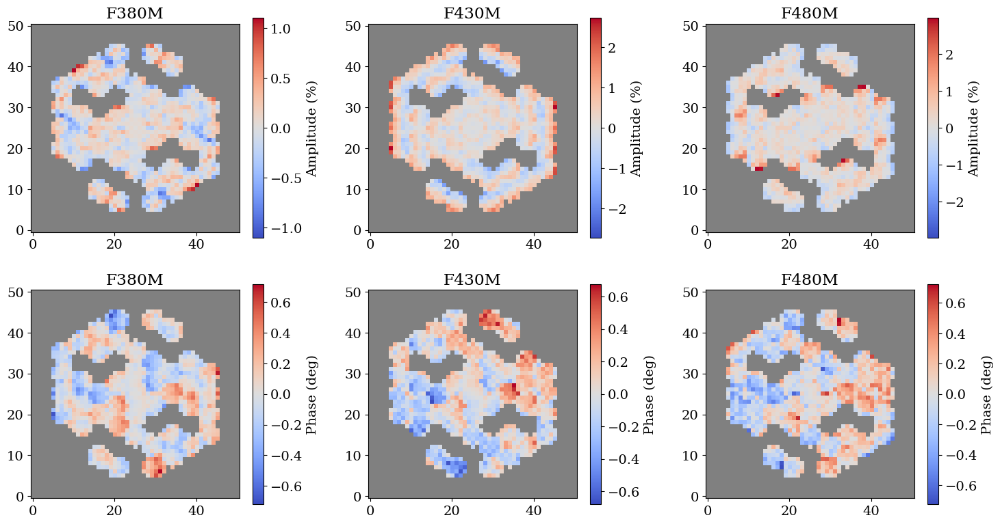

In [34]:
# from amigo.vis_models import project

plt.figure(figsize=(15, 8))
for i, filt in enumerate(filters):
    otf_coords = vis_model.otf_coords

    # Calibrator
    exp = exp_dict["cal"][filt]
    cal_vis = result.model.get(exp.map_param("vis"))

    # Science
    exp = exp_dict["sci"][filt]
    sci_vis = result.model.get(exp.map_param("vis"))

    # Calibrated
    latent_calib_vis = cal_vis - sci_vis
    log_amp, phase = project(latent_calib_vis, vis_model.V[filt])
    log_amp, phase = vis_to_im(log_amp, phase, (51, 51))
    # vis = np.dot(latent_calib_vis, vis_model.V[filt])

    #
    # amp, phase = vis_to_im(vis, (51, 51))
    amp = np.where(otf_mask, 100 * (np.exp(log_amp) - 1), np.nan)
    phase = np.where(otf_mask, dlu.rad2deg(phase), np.nan)

    v = np.nanmax(np.abs(amp))
    plt.subplot(2, 3, i + 1)
    plt.title(f"{filt}")
    plt.imshow(amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 3, i + 4)
    plt.title(f"{filt}")
    plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

plt.tight_layout()
plt.show()

In [35]:
import jax.tree as jtu
from tqdm.notebook import tqdm
from amigo.fisher import FIM


fmats = {}
for exp in tqdm(exposures):
    # for param in ["amplitudes", "phases"]:
    loglike_fn = lambda model: -np.nansum(log_likelihood(model, exp))
    fmat = FIM(result.model, [exp.map_param('vis')], loglike_fn, reduce_ram=True, batch_size=20)
    fmats[exp.map_param("vis")] = fmat
covs = jtu.map(lambda x: np.linalg.inv(x), fmats)

  0%|          | 0/6 [00:00<?, ?it/s]

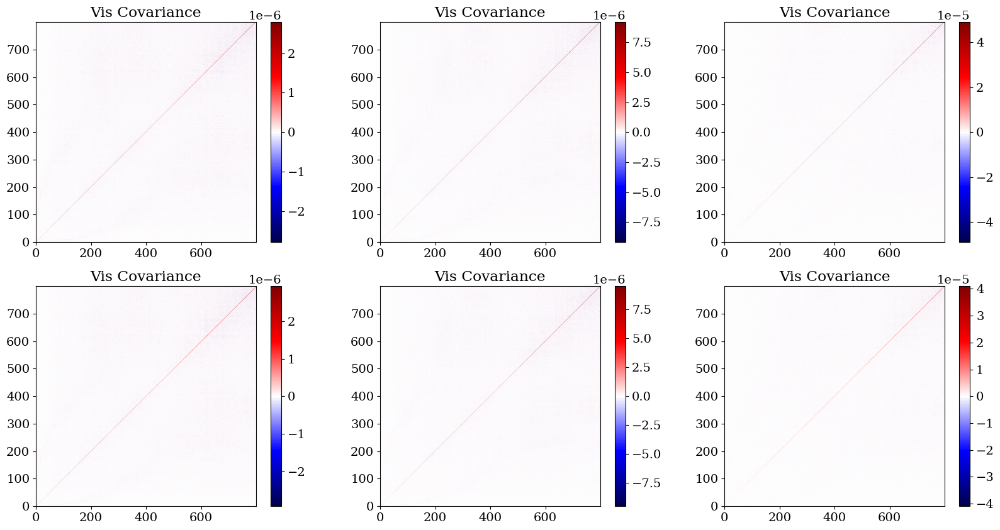

In [36]:
plt.figure(figsize=(20, 10))
for i, key in enumerate(covs):
    cov = covs[key]
    plt.subplot(2, 3, i + 1)
    plt.title("Vis Covariance")
    v = np.nanmax(np.abs(cov))
    plt.imshow(cov, seismic, vmin=-v, vmax=v)
    # plt.imshow(np.log10(np.abs(cov)), inferno)
    plt.colorbar()
plt.show()

## Analysis Method

**Data Fitting**

We want to fit a unique WFE to each exposure, since we have some tilt events happening in the data. We also want to fit a unique set of visibilities per exposure.

**Finding the kernel phase matrices**

We have a unique WFE for each exposure, but we want to ensure we use the _same_ kernel phase matrix on all exposures to ensure consistency. This requires finding the average WFE over each filter, and calculating the kernel phase matrix from there.

Then we project all the phase values to kernel phases, and average them in that space.

Now we want to find the average zernikes for _each filter_ so we can build our kernel phase matrices

In [37]:
zernikes = {}
for exp in exposures:
    if exp.filter not in zernikes.keys():
        zernikes[exp.filter] = []
    zernikes[exp.filter].append(result.model.get(exp.map_param("aberrations")))

zernikes = jtu.map(lambda x: np.array(x).mean(0), zernikes, is_leaf=lambda x: isinstance(x, list))

jtu.map(lambda x: x.shape, zernikes)

{'F380M': (7, 10), 'F430M': (7, 10), 'F480M': (7, 10)}

In [38]:
thresh = 1e-12
params = ["positions", "aberrations"]

kernel_matrices = {}
for filt, zern in tqdm(zernikes.items()):

    # Find an appropriate exposure
    for exp in exposures:
        if exp.filter == filt and exp.star == "HD-205827":
            break

    # Get the Jacobian
    fn = lambda model, exp: vis_jac_fn(model, exp)
    _model = result.model.set(exp.map_param("aberrations"), zern)
    J = model_batched_jacobian(fn, _model, exp, params, n_batch=5)

    # Get the Jacobian decomposition
    u, s, vh = np.linalg.svd(J, full_matrices=True)
    n_keep = np.sum((s / s[0]) < thresh)
    zern_operator = u[:, :len(s) - n_keep].T
    null_operator = u[:, len(s) - n_keep :].T
    kernel_matrices[filt] = null_operator
    print()

jtu.map(lambda x: x.shape, kernel_matrices)

  0%|          | 0/3 [00:00<?, ?it/s]

{'F380M': (731, 800), 'F430M': (731, 800), 'F480M': (731, 800)}

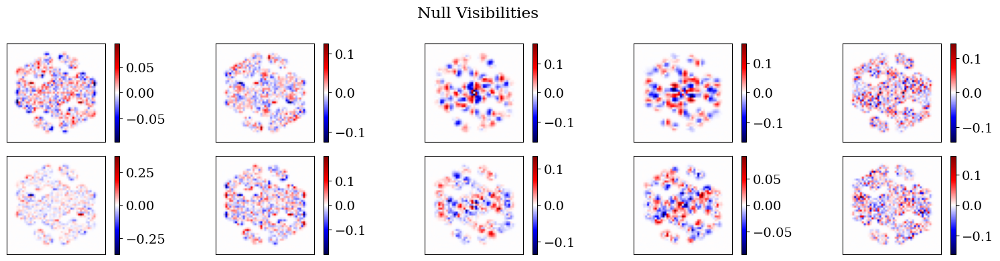

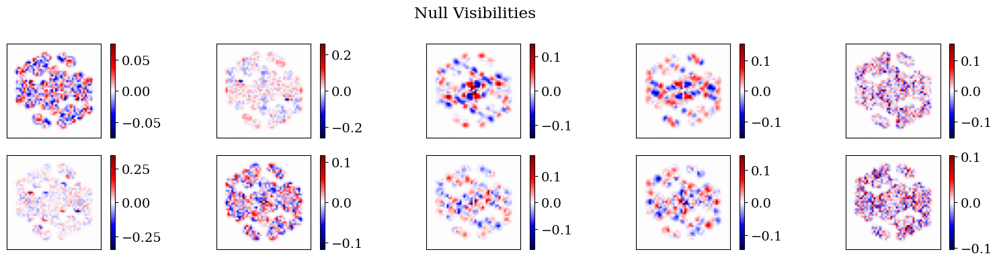

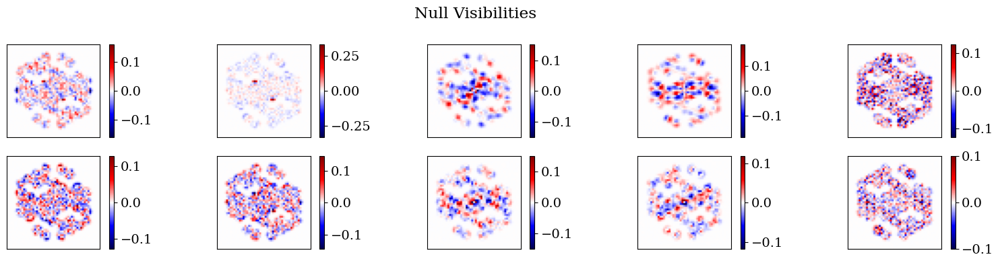

In [39]:
for filt in filters:
    K = kernel_matrices[filt]
    log_amps, phases = vmap(project, in_axes=(0, None))(K, vis_model.V[filt])

    fig = plt.figure(figsize=(16, 4))
    plt.suptitle("Null Visibilities")
    for i, ind in enumerate([0, 2, 3, 4, -1]):
        log_amp, phase = vis_to_im(log_amps[ind], phases[ind], (51, 51))

        v = np.nanmax(np.abs(log_amp))
        ax = plt.subplot(2, 5, i + 1)
        im = ax.imshow(log_amp, seismic, vmin=-v, vmax=v)
        ax.set(xticks=[], yticks=[])
        fig.colorbar(im)

        v = np.nanmax(np.abs(phase))
        ax = plt.subplot(2, 5, i + 6)
        im = ax.imshow(phase, seismic, vmin=-v, vmax=v)
        ax.set(xticks=[], yticks=[])
        fig.colorbar(im)

    plt.tight_layout()
    # plt.savefig("figures/tmp/kernel_phase.jpg")
    plt.show()

In [40]:
# outputs = {}
# for exp in exposures:

#     amp = result.model.get(exp.map_param("amplitudes"))
#     phase = result.model.get(exp.map_param("phases"))
#     phases = np.dot(phase, vis_model.phase_matrix[exp.filter])

# vis_exposures = {
#     "HD-205827": [exp for exp in exposures if exp.star == "HD-205827"],
#     "HD-206893": [exp for exp in exposures if exp.star == "HD-206893"],
# }

In [41]:
cal_stars = ["HD-205827"]
sci_stars = ["HD-206893"]

vis_exposures = {
    "cal": [exp for exp in exposures if exp.star in cal_stars],
    "sci": [exp for exp in exposures if exp.star in sci_stars],
}

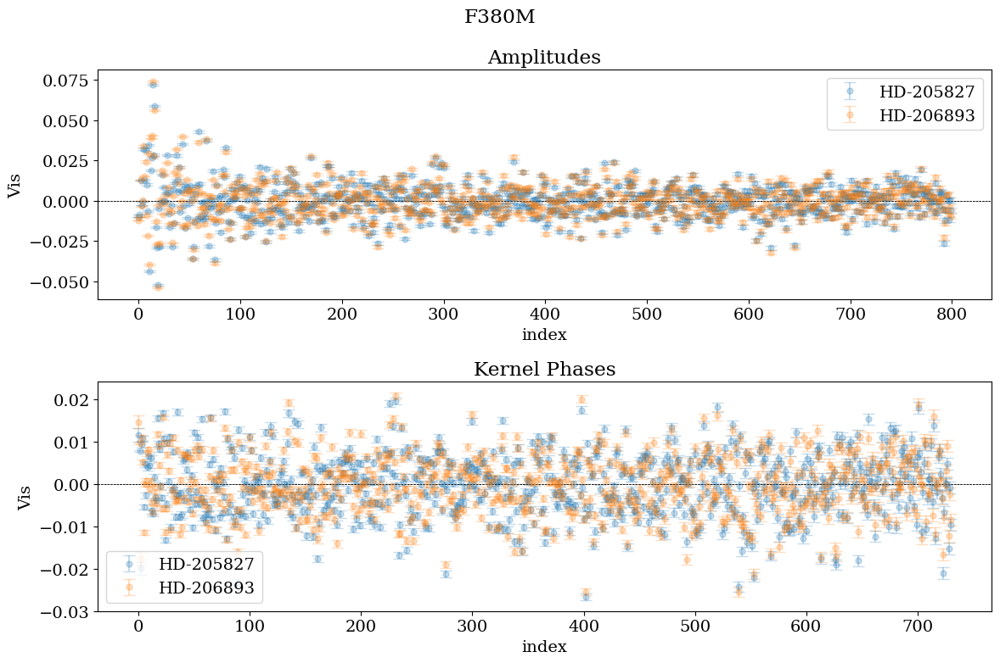

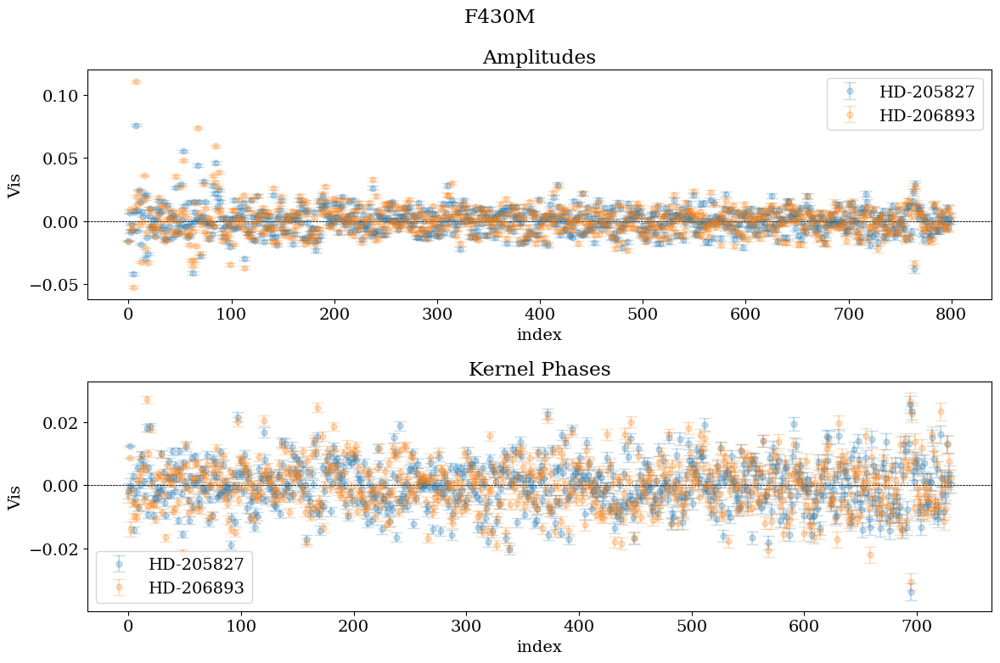

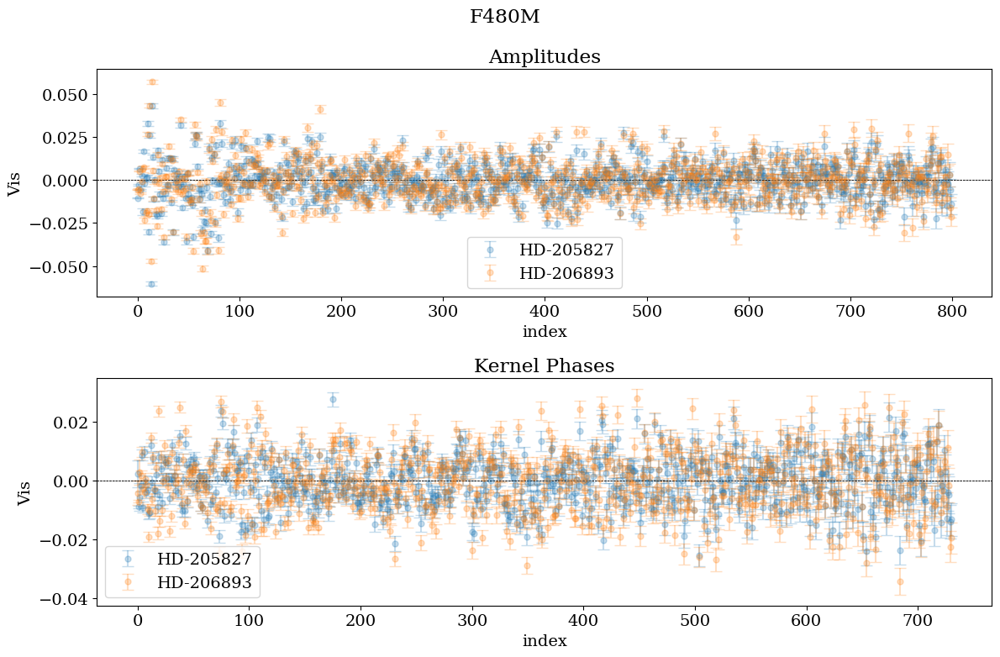

In [42]:
for filt in filters:
    fig = plt.figure(figsize=(12, 8))
    fig.suptitle(f"{filt}")
    axes = fig.subplots(2, 1)

    for star_type, exps in vis_exposures.items():
        if star_type == "cal":
            stars = cal_stars
        else:
            stars = sci_stars

        for exp in exps:
            if exp.filter == filt and exp.star in stars:
                vis = result.model.get(exp.map_param("vis"))
                cov = covs[exp.map_param("vis")]
                null_operator = kernel_matrices[exp.filter]
                null_vis = np.dot(null_operator, vis)
                null_vis_cov = np.dot(null_operator, np.dot(cov, null_operator.T))

                vis_err = np.sqrt(np.diag(cov))
                null_vis_err = np.sqrt(np.diag(null_vis_cov))

                inds = np.arange(len(vis))
                null_inds = np.arange(len(null_vis))

                #
                star = exp.star
                axes[0].errorbar(inds, vis, yerr=vis_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')
                axes[1].errorbar(null_inds, null_vis, yerr=null_vis_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')

        axes[0].axhline(0, color="k", ls="--", lw=0.5)
        axes[1].axhline(0, color="k", ls="--", lw=0.5)

        axes[0].set(ylabel="Vis", xlabel="index", title="Amplitudes")
        axes[1].set(ylabel="Vis", xlabel="index", title="Kernel Phases")

        axes[0].legend()
        axes[1].legend()

    plt.tight_layout()
    plt.show()

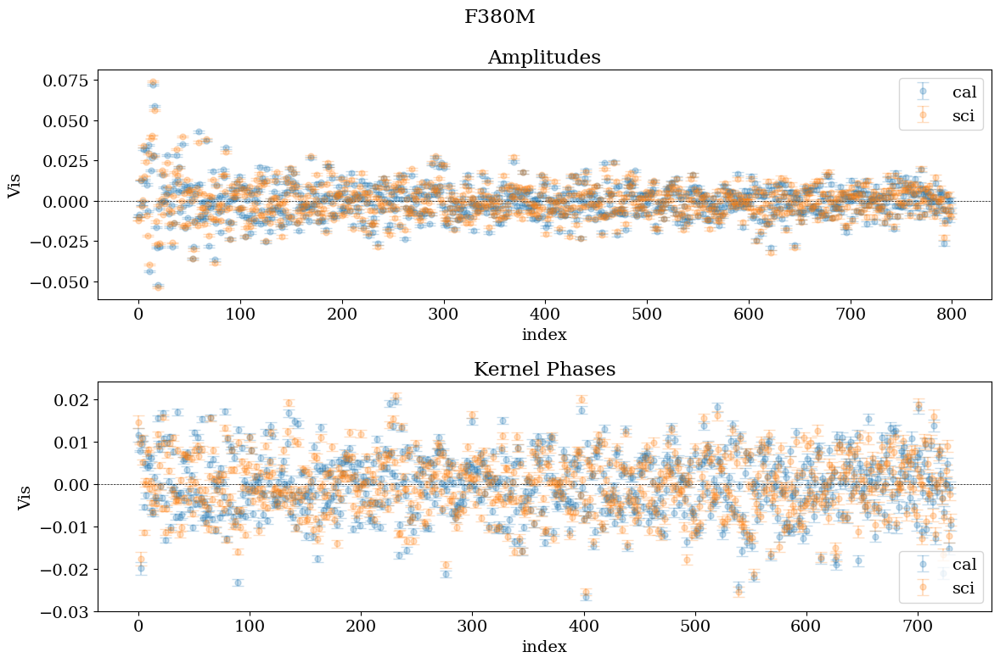

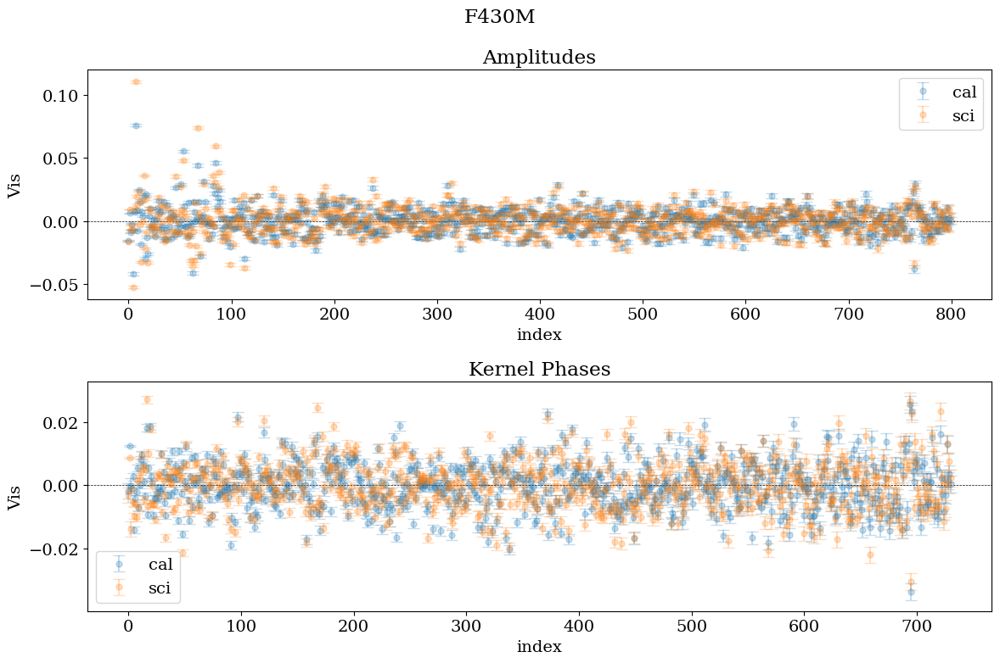

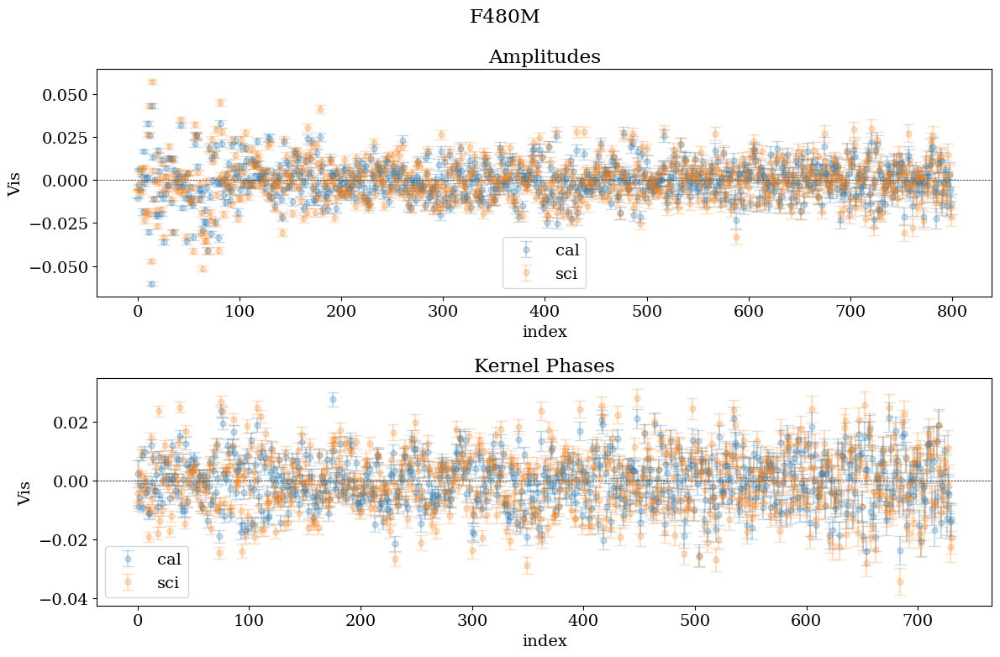

In [43]:
def get_mean_wavelength(wavels, weights):
    """Get the spectrally weighted mean wavelength"""
    return ((wavels * weights).sum() / weights.sum()).mean()


vis_outputs = {}

for filt in filters:

    fig = plt.figure(figsize=(12, 8))
    fig.suptitle(f"{filt}")
    axes = fig.subplots(2, 1)

    for star_type, exps in vis_exposures.items():
        if star_type == "cal":
            stars = cal_stars
        else:
            stars = sci_stars

        vis, vis_covs = [], []
        null_vis, null_vis_covs = [], []
        parangs = []
        spectra = []
        for exp in exps:
            if exp.filter == filt and exp.star in stars:
                vis_vals = result.model.get(exp.map_param("vis"))
                cov = covs[exp.map_param("vis")]
                null_operator = kernel_matrices[exp.filter]
                null_vis_vals = np.dot(null_operator, vis_vals)
                null_vis_cov = np.dot(null_operator, np.dot(cov, null_operator.T))

                vis.append(vis_vals)
                vis_covs.append(cov)
                null_vis.append(null_vis_vals)
                null_vis_covs.append(null_vis_cov)

                if star_type == "sci":
                    parangs.append(exp.parang)
                    spectra.append(exp.get_spectra(model))

        vis = np.array(vis).mean(0)
        vis_cov = np.array(vis_covs).mean(0)
        null_vis = np.array(null_vis).mean(0)
        null_vis_cov = np.array(null_vis_covs).mean(0)

        # Get the errors
        vis_err = np.sqrt(np.diag(vis_cov))
        null_vis_err = np.sqrt(np.diag(null_vis_cov))

        # Put it all together
        key = f"{star_type}_{filt}"
        vis_outputs[key] = {
            "vis": vis,
            "null_vis": null_vis,
            "vis_cov": vis_cov,
            "null_vis_cov": null_vis_cov,
        }

        # Wavelengths & Parallactic angle
        if star_type == "sci":
            assert np.array(parangs).std(0) < 0.1
            vis_outputs[key]["wavel"] = get_mean_wavelength(*np.array(spectra).mean(0))
            vis_outputs[key]["parang"] = np.array(parangs).mean(0)

        axes[0].errorbar(inds, vis, yerr=vis_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')
        axes[1].errorbar(null_inds, null_vis, yerr=null_vis_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')

    axes[0].axhline(0, color="k", ls="--", lw=0.5)
    axes[1].axhline(0, color="k", ls="--", lw=0.5)

    axes[0].set(ylabel="Vis", xlabel="index", title="Amplitudes")
    axes[1].set(ylabel="Vis", xlabel="index", title="Kernel Phases")

    axes[0].legend()
    axes[1].legend()

    plt.tight_layout()
    plt.show()

In [44]:
from amigo.vis_analysis import calibrate_amplitudes, calibrate_phases

cal_vis_outputs = {}
for filt in filters:

    # Calibrator values
    cal_key = f"cal_{filt}"
    cal_null_vis = vis_outputs[cal_key]["null_vis"]
    cal_null_vis_cov = vis_outputs[cal_key]["null_vis_cov"]

    # Science values
    sci_key = f"sci_{filt}"
    sci_null_vis = vis_outputs[sci_key]["null_vis"]
    sci_null_vis_cov = vis_outputs[sci_key]["null_vis_cov"]

    # Calibrate
    null_vis, null_vis_cov = calibrate_phases(cal_null_vis, sci_null_vis, cal_null_vis_cov, sci_null_vis_cov)

    # uv coordinates
    parang = vis_outputs[sci_key]["parang"]
    n = (vis_model.n_knots**2 // 2)
    u, v = vis_model.otf_coords.reshape(2, -1)[:, :n]
    u, v = dlu.rotate_coords(np.array([u, -v]), -dlu.deg2rad(parang))

    # Put it all together
    cal_vis_outputs[f"{filt}"] = {
        "u": u,
        "v": v,
        "parang": parang,
        "V": vis_model.V[filt],
        "K": kernel_matrices[filt],
        "wavel": vis_outputs[sci_key]["wavel"],
        "null_vis": null_vis,
        "null_vis_cov": null_vis_cov,
    }

In [45]:
for exp in exposures:
    print(exp.parang)

71.57991536242686
70.7324360711143
70.73243005523526
71.57992086032128
70.73243534970793
71.57991507590647


In [46]:
import equinox as eqx
from drpangloss.models import OIData

class AmigoOIData(OIData):
    #
    vis_cov: np.ndarray

    #
    null_vis: np.ndarray
    d_null_vis: np.ndarray
    null_vis_cov: np.ndarray

    #
    null_V: np.ndarray
    V_inv: np.ndarray
    parang: np.ndarray
    # use_null_phase: bool = eqx.field(static=True)

    def __init__(self, oi_data):#, use_null_phase=False):
        """
        Default should have vis, phi as their _latent_ values
        """
        #
        self.u = np.array(oi_data["u"], dtype=float)
        self.v = np.array(oi_data["v"], dtype=float)
        self.wavel = np.array(oi_data["wavel"], dtype=float)
        self.parang = np.array(oi_data["parang"], dtype=float)

        #
        self.i_cps1 = None
        self.i_cps2 = None
        self.i_cps3 = None
        self.v2_flag = False
        self.cp_flag = False

        #
        self.vis = np.array(oi_data["vis"], dtype=float)
        self.null_vis = np.array(oi_data["null_vis"], dtype=float)

        #
        self.phi = None
        self.d_phi = None

        #
        self.vis_cov = np.array(oi_data["vis_cov"], dtype=float)
        self.null_vis_cov = np.array(oi_data["null_vis_cov"], dtype=float)

        #
        self.d_vis = np.diag(self.vis_cov) ** 0.5
        self.d_null_vis = np.diag(self.null_vis_cov) ** 0.5

        # Operators and projection matrices
        # These projection matrices go from latent -> pixel, so we save the inverse
        self.V_inv = np.linalg.pinv(np.array(oi_data["V"], dtype=float))

        #
        # The Kernel phase matrix goes from latent -> pixel, so we dont invert
        self.null_V = np.array(oi_data["null_V_mat"], dtype=float)
        # self.use_null_phase = bool(use_null_phase)

    def to_null(self, vis):
        """Project the vis to the null space"""
        return np.dot(self.null_V, vis)

    def to_latent(self, vis):
        return np.dot(vis, self.V_inv)

    def flatten_data(self):
        """
        Flatten closure phases and uncertainties.
        """

        # if self.use_null_phase:
        #     phi = self.Kphi
        #     d_phi = self.d_Kphi
        # else:
        #     phi = self.phi
        #     d_phi = self.d_phi

        # full_vis = np.concatenate([self.vis, phi])
        # errs = np.concatenate([self.d_vis, d_phi])
        return self.null_vis, self.d_null_vis

    def flatten_model(self, cvis):
        """
        cvis: complex visibilities from model

        Flatten model visibilities and phases.
        """
        vis = np.concatenate([np.log10(np.abs(cvis)), np.angle(cvis)])
        latent_vis = self.to_latent(vis)
        return self.to_null(latent_vis)

    # Overwrite this, it was a mistake from the beginning
    def __repr__(self):
        return eqx.Module.__repr__(self)

In [62]:
import zodiax as zdx

class AmigoOIData(zdx.Base):
    # Coordinates
    u: np.ndarray
    v: np.ndarray
    wavel: np.ndarray
    parang: np.ndarray

    # Kernel Visibilities
    K_vis: np.ndarray
    dK_vis: np.ndarray

    # Operators & Projection matrices
    V: np.ndarray # Latent -> Pixel
    V_inv: np.ndarray # Pixel -> Latent
    K: np.ndarray # Latent -> Null
    K_inv: np.ndarray # Null -> Latent

    def __init__(self, oi_data):
        """
        Default should have vis, phi as their _latent_ values
        """
        self.u = np.array(oi_data["u"], dtype=float)
        self.v = np.array(oi_data["v"], dtype=float)
        self.wavel = np.array(oi_data["wavel"], dtype=float)
        self.parang = np.array(oi_data["parang"], dtype=float)

        #
        self.K_vis = np.array(oi_data["null_vis"], dtype=float)
        self.dK_vis = np.diag(oi_data["null_vis_cov"]) ** 0.5

        # Operators and projection matrices
        self.V = np.array(oi_data["V"], dtype=float)
        self.V_inv = np.linalg.pinv(self.V)
        self.K = np.array(oi_data["K"], dtype=float)
        self.K_inv = np.linalg.pinv(self.K)

    def latent_to_pixel(self, latent_vis):
        return np.dot(latent_vis, self.V)

    def latent_to_null(self, latent_vis):
        # return np.dot(latent_vis, self.K)
        return np.dot(self.K, latent_vis)

    def pixel_to_latent(self, vis_vec):
        return np.dot(vis_vec, self.V_inv)

    def null_to_latent(self, K_vis):
        return np.dot(K_vis, self.K_inv)

    def flatten_data(self):
        """ Flatten closure phases and uncertainties."""
        return self.K_vis, self.dK_vis

    def flatten_model(self, cvis):
        """
        cvis: complex visibilities from model
        Flatten model visibilities and phases.
        """
        # Project the visibilities to the latent then null space
        vis_vec = np.concatenate([np.log10(np.abs(cvis)), np.angle(cvis)])
        latent_vis = self.pixel_to_latent(vis_vec)
        return self.latent_to_null(latent_vis)

    def model(self, model_object):
        """
        Compute the model visibilities and phases for the given model object.
        """
        cvis = model_object.model(self.u, self.v, self.wavel)
        return self.flatten_model(cvis)

    # Overwrite this, it was a mistake from the beginning
    def __repr__(self):
        return eqx.Module.__repr__(self)

In [63]:
from amigo.vis_analysis import likelihood_grid, optimized_contrast_grid
from drpangloss.models import BinaryModelCartesian


def fit_oi_data(
    grid,
    oi_data,
    # amp_scale=1.0,
    # phi_scale=1.0,
    # Kphi_scale=1.0,
    n_batch=50,
    use_null=False,
    obj=AmigoOIData,
):
    # Scale the errors
    oi_obj = obj(oi_data)#, use_null_phase=use_null)
    # oi_obj = oi_obj.multiply("d_vis", amp_scale)
    # oi_obj = oi_obj.multiply("d_phi", phi_scale)
    # oi_obj = oi_obj.multiply("d_null_vis", Kphi_scale)

    # NOTE: The log-likelihood image seems to come out (Dec, RA), so we _dont_ need to
    # transpose the output
    # Log-likelihood
    loglike_im = likelihood_grid(oi_obj, BinaryModelCartesian, grid, n_batch=n_batch)
    loglike_im = loglike_im.max(axis=2)

    # NOTE: The Contrast image seems to come out (RA, Dec), so we transpose the output
    # Best contrast
    contrast_im = optimized_contrast_grid(
        oi_obj, BinaryModelCartesian, grid, n_batch=n_batch
    )
    contrast_im = np.where(contrast_im < 0, 0, contrast_im).T

    # # Get the FoVs
    r_bls = np.hypot(oi_data["u"], oi_data["v"])
    min_bls, max_bls = r_bls.min(), r_bls.max()
    min_fov = 1e3 * dlu.rad2arcsec(oi_data["wavel"] / (2 * max_bls))
    max_fov = 1e3 * dlu.rad2arcsec(oi_data["wavel"] / (2 * min_bls))

    # Mask the fov
    rs = np.hypot(*np.meshgrid(grid["dra"], grid["ddec"]))
    r_max = np.minimum(max_fov, 2 * grid["dra"].max())
    # rmask = (rs > min_fov / 2) & (rs <= r_max / 2)
    rmask = (rs > 200 / 2) & (rs <= r_max / 2)
    loglike_im = np.where(rmask, loglike_im, np.nan)
    contrast_im = np.where(rmask, contrast_im, np.nan)

    # Return the images
    return loglike_im, contrast_im, (min_fov, max_fov)

In [64]:
AmigoOIData(cal_vis_outputs["F430M"])

AmigoOIData(
  u=f64[1300],
  v=f64[1300],
  wavel=f64[],
  parang=f64[],
  K_vis=f64[731],
  dK_vis=f64[731],
  V=f64[800,2600],
  V_inv=f64[2600,800],
  K=f64[731,800],
  K_inv=f64[800,731]
)

RA: 100.85
Dec: 148.31
F380M: -3.02
F430M: -inf
F480M: -inf


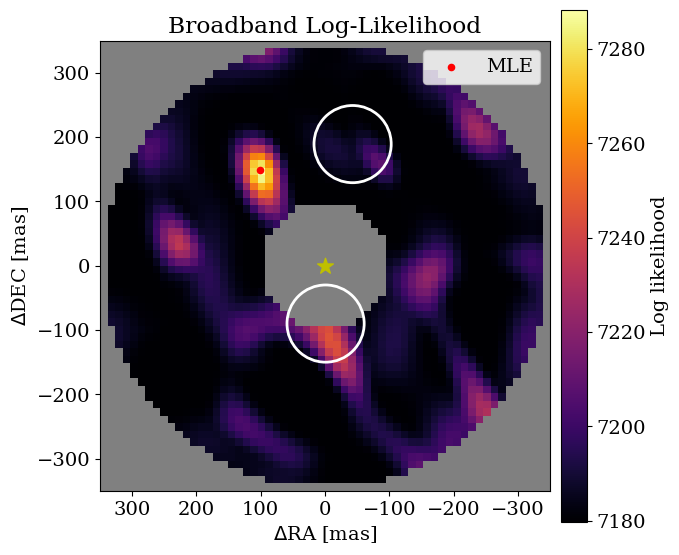

In [65]:
# from amigo.vis_analysis import fit_oi_data
import matplotlib.patches as patches

binaries = [
    (-43, 189), # Ra, Dec
    (-1, -90), # Ra, Dec
]

# Samples
n = 60
size = 350 # mas
RAs = np.linspace(size, -size, n)
Decs = np.linspace(-size, size, n)
fluxes = np.linspace(-6, 0, n)
grid = {"dra": RAs, "ddec": Decs, "flux": 10 ** fluxes}


#
loglike_ims, contrast_ims, fovs = {}, {}, {}
for filt, oi_data in cal_vis_outputs.items():
    loglike_im, contrast_im, fov = fit_oi_data(
        grid, oi_data, 
        # amp_scale=5,
        # phi_scale=1,
        # Kphi_scale=1,
        n_batch=100, 
        # use_null=True,
    )
    loglike_ims[filt] = loglike_im
    contrast_ims[filt] = contrast_im
    fovs[filt] = fov

# Get the MLEs
loglike_im = np.array(jtu.leaves(loglike_ims)).sum(axis=0)
dec_ind, ra_ind = np.where(loglike_im == np.nanmax(loglike_im))
contrast_mles = jtu.map(lambda x: np.log10(x[*dec_ind, *ra_ind]), contrast_ims)
ra_mle, dec_mle = RAs[*ra_ind], Decs[*dec_ind]

# print("(RA, Dec)")
print(f"RA: {ra_mle:.2f}")
print(f"Dec: {dec_mle:.2f}")
[print(f"{filt}: {contrast:.2f}") for filt, contrast in contrast_mles.items()]


#
extent = (RAs[0], RAs[-1], Decs[0], Decs[-1])
make_circle = lambda position, diameter, **kwargs: patches.Circle(
    position, diameter / 2, color="w", fill=False, linewidth=2, **kwargs
)

plt.figure(figsize=(7, 7))
ax = plt.subplot(1, 1, 1)
plt.imshow(loglike_im, cmap=inferno, aspect="equal", extent=extent)
plt.colorbar(shrink=0.95, label="Log likelihood", pad=0.02)
plt.scatter(0, 0, s=140, c="y", marker="*")
ax.set(title="Broadband Log-Likelihood", xlabel="$\\Delta$RA [mas]", ylabel="$\\Delta$DEC [mas]",)
ax.scatter(ra_mle, dec_mle, s=80, c="r", marker=".", label="MLE")
[ax.add_patch(make_circle(binary, 120)) for binary in binaries]
# ax.add_patch(make_circle((0, 0), diff_lim, ls="--", label="Diffraction limit"))
ax.legend()
plt.show()

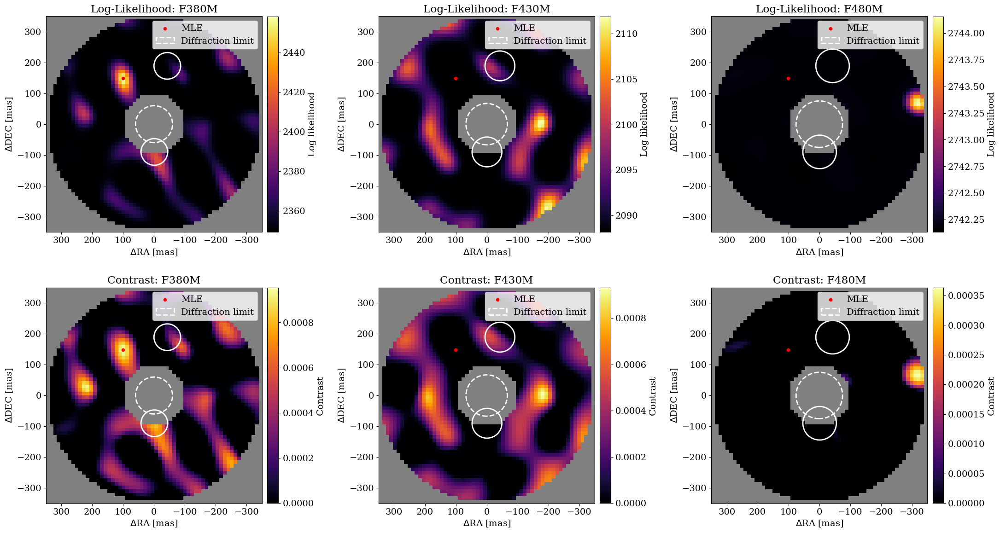

: 

In [ ]:
plt.figure(figsize=(22, 12))
for i, filt in enumerate(loglike_ims.keys()):
    loglike_im = loglike_ims[filt]
    contrast_im = contrast_ims[filt]
    oi_data = cal_vis_outputs[filt]
    min_fov, max_fov = fovs[filt]
    wavel = oi_data["wavel"]

    diff_lim = 1e3 * dlu.rad2arcsec(wavel / optics.diameter)

    def add_to_ax(ax):
        ax.scatter(ra_mle, dec_mle, s=80, c="r", marker=".", label="MLE")
        [ax.add_patch(make_circle(binary, 2*min_fov)) for binary in binaries]
        ax.add_patch(make_circle((0, 0), diff_lim, ls="--", label="Diffraction limit"))
        ax.legend()

    #
    ax1 = plt.subplot(2, 3, i + 1)
    plt.imshow(loglike_im, cmap=inferno, aspect="equal", extent=extent)
    plt.colorbar(shrink=0.95, label="Log likelihood", pad=0.02)
    ax1.set(
        title=f"Log-Likelihood: {filt}",
        xlabel="$\\Delta$RA [mas]",
        ylabel="$\\Delta$DEC [mas]",
    )
    add_to_ax(ax1)

    ax2 = plt.subplot(2, 3, i + 4)
    plt.imshow(contrast_im, cmap=inferno, aspect="equal", extent=extent, vmin=0)
    plt.colorbar(shrink=0.95, label="Contrast", pad=0.02)
    ax2.set(
        title=f"Contrast: {filt}",
        xlabel="$\\Delta$RA [mas]",
        ylabel="$\\Delta$DEC [mas]",
    )
    add_to_ax(ax2)

plt.tight_layout()
plt.show()

In [ ]:
import numpyro as npy
import numpyro.distributions as dist

ra, dec = binaries[0]

def sampling_fn(oi_data_obj, model_class):

    # Define priors
    r = 75
    dra = npy.sample("Δ RA", dist.Uniform(ra - r, ra + r))
    ddec = npy.sample("Δ Dec", dist.Uniform(dec - r, dec + r))
    log_flux = npy.sample("log Flux", dist.Uniform(-4, 0))
    errorscale = npy.sample("jitter", dist.Uniform(0.0, 2.0))

    # Track the outputs of the model and the PA/Sep/DMag
    _ = npy.deterministic("PA", dlu.rad2deg(np.arctan2(dra, dec)))
    _ = npy.deterministic("Sep", np.hypot(dra, ddec))
    _ = npy.deterministic("Δ Mag", -2.5 * log_flux)
    pred_data = npy.deterministic(
        "pred", oi_data_obj.model(model_class(dra, ddec, 10**log_flux))
    )

    data, errors = oi_data_obj.flatten_data()
    model_sampler = dist.Normal(pred_data, errors * 10**errorscale)
    return npy.sample("Sampler", model_sampler, obs=data)

In [ ]:
from drpangloss.models import OIData, BinaryModelCartesian
from amigo.vis_analysis import AmigoOIData

samplers, oi_objs = {}, {}

for i, (filt, oi_data) in enumerate(cal_vis_outputs.items()):
    oi_data_obj = AmigoOIData(oi_data, use_null_phase=True)
    oi_data_obj = oi_data_obj.multiply("d_vis", 5)
    oi_data_obj = oi_data_obj.multiply("d_phi", 1)
    oi_data_obj = oi_data_obj.multiply("d_Kphi", 1)

    sampler = npy.infer.MCMC(
        npy.infer.NUTS(sampling_fn),
        num_warmup=10000,
        num_samples=10000,
    )
    sampler.run(jr.PRNGKey(0), oi_data_obj, BinaryModelCartesian)

    posterior_pred = sampler.get_samples()["pred"]
    print(f"{filt}: Error scaling:", 10 ** sampler.get_samples()["jitter"].mean())

    samplers[filt] = sampler
    oi_objs[filt] = oi_data_obj

sample: 100%|█| 20000/20000 [01:02<00:00, 321.90it/s, 15 steps of size 3.34e-01. acc. prob=0.90


F380M: Error scaling: 2.8355354260723895


sample: 100%|█| 20000/20000 [01:05<00:00, 303.29it/s, 15 steps of size 2.97e-01. acc. prob=0.87


F430M: Error scaling: 3.568264676403128


sample: 100%|█| 20000/20000 [01:16<00:00, 259.81it/s, 15 steps of size 1.89e-01. acc. prob=0.87

F480M: Error scaling: 1.0811374729106717


In [ ]:
print(sampler.get_samples().keys())

for sampler in samplers.values():
    sampler.print_summary()

dict_keys(['PA', 'Sep', 'jitter', 'log Flux', 'pred', 'Δ Dec', 'Δ Mag', 'Δ RA'])

                mean       std    median      5.0%     95.0%     n_eff     r_hat
    jitter      0.45      0.01      0.45      0.44      0.47   5453.87      1.00
  log Flux     -3.06      0.20     -3.02     -3.33     -2.78   1364.40      1.00
     Δ Dec    193.98     12.80    193.71    174.33    212.48   4510.93      1.00
      Δ RA    -47.44     15.16    -46.62    -70.67    -23.61   4657.13      1.00

Number of divergences: 0

                mean       std    median      5.0%     95.0%     n_eff     r_hat
    jitter      0.55      0.01      0.55      0.53      0.57   5926.45      1.00
  log Flux     -3.46      0.32     -3.47     -4.00     -3.02   3057.73      1.00
     Δ Dec    196.54     39.59    201.19    135.27    262.44   5398.71      1.00
      Δ RA    -44.41     41.61    -43.98   -117.74     13.64   6844.98      1.00

Number of divergences: 31

                mean       std    median      5.0%   

(381,)
(381,)
(381,)


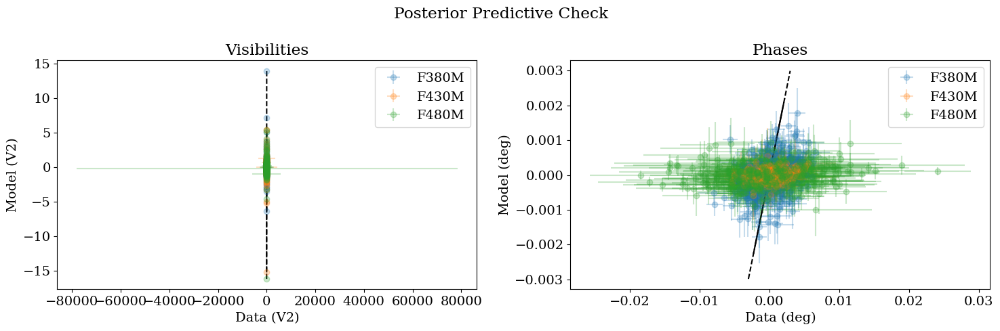

Parameter Δ RA in chain F430M is not constrained
Parameter log Flux in chain F430M is not constrained


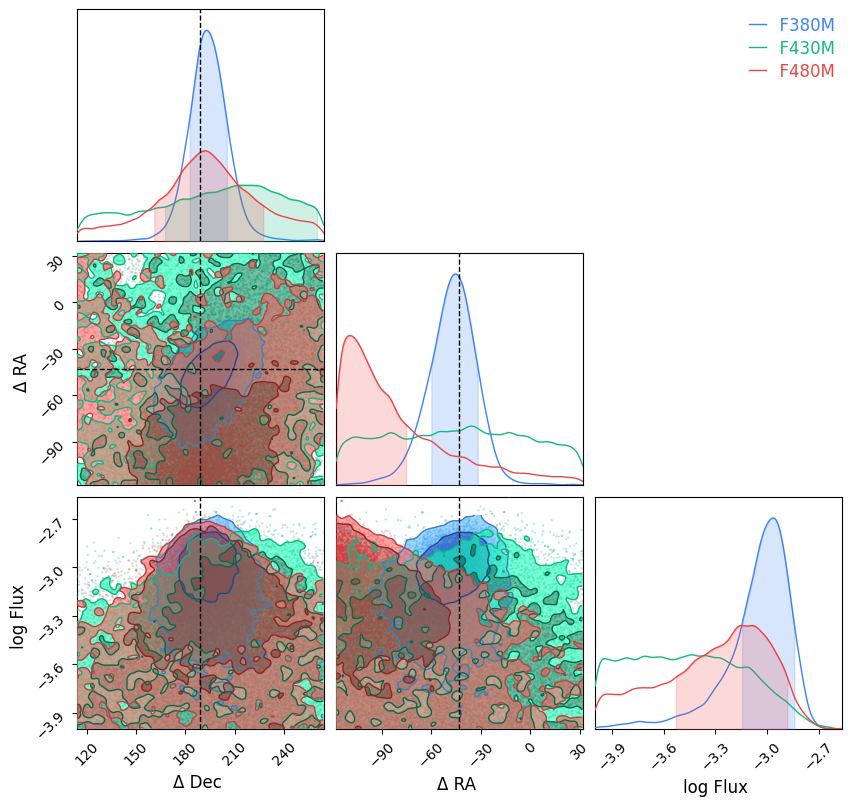

In [ ]:
import pandas as pd
from chainconsumer import ChainConsumer, Chain, Truth, PlotConfig

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle("Posterior Predictive Check")
for i, (filt, oi_data_obj) in enumerate(oi_objs.items()):

    sampler = samplers[filt]

    posterior_pred = sampler.get_samples()["pred"]
    posterior_mean = np.mean(posterior_pred, axis=0)
    posterior_std = np.std(posterior_pred, axis=0)
    n = len(oi_data_obj.vis)

    vis = oi_data_obj.vis
    d_vis = oi_data_obj.d_vis

    if oi_data_obj.use_null_phase:
        phi = oi_data_obj.Kphi
        d_phi = oi_data_obj.d_Kphi
    else:
        phi = oi_data_obj.phi
        d_phi = oi_data_obj.d_phi

    vis_pred = posterior_mean[:n]
    phi_pred = posterior_mean[n:]
    vis_std = posterior_std[:n]
    phi_std = posterior_std[n:]

    vis_med = np.median(vis_std)
    vis_min, vis_max = vis_pred.min(), vis_pred.max()
    vis_121 = np.linspace(vis_min - 5 * vis_med, vis_max + 5 * vis_med, 100)

    phi_med = np.median(phi_std)
    phi_min, phi_max = phi_pred.min(), phi_pred.max()
    phi_121 = np.linspace(phi_min - 5 * phi_med, phi_max + 5 * phi_med, 100)

    # plot data
    ax1.plot(vis_121, vis_121, "k--")
    ax1.errorbar(
        vis,
        vis_pred,
        xerr=d_vis,
        yerr=vis_std,
        fmt="o",
        alpha=0.25,
        color=f"C{i}",
        label=filt,
    )

    print(phi.shape)

    ax2.plot(phi_121, phi_121, "k--")
    ax2.errorbar(
        phi,
        phi_pred,
        xerr=d_phi,
        yerr=phi_std,
        fmt="o",
        alpha=0.25,
        color=f"C{i}",
        label=filt,
    )

    ax1.set(
        title="Visibilities",
        xlabel="Data (V2)",
        ylabel="Model (V2)",
    )

    ax2.set(
        title="Phases",
        xlabel="Data (deg)",
        ylabel="Model (deg)",
    )
    ax1.legend()
    ax2.legend()

plt.tight_layout()
plt.show()


true_ra, true_dec = binaries[0]
truths = {
    "Δ Dec": true_dec,
    "Δ RA": true_ra,
    "log Flux": -1.5,
}

c = ChainConsumer()
c.add_truth(Truth(location=truths))

for filt, sampler in samplers.items():
    results = sampler.get_samples()
    results = {key: results[key] for key in ["Δ Dec", "Δ RA", "log Flux"]}
    cc_df = pd.DataFrame.from_dict(results)

    c.add_chain(
        Chain(
            samples=cc_df,
            name=filt,
            plot_cloud=True,
            marker_style="*",
            marker_size=100,
        )
    )

c.plotter.plot()
plt.show()